<a target="_blank" href="https://colab.research.google.com/github/AI4Finance-Foundation/FinRL-Tutorials/blob/master/1-Introduction/FinRL_Ensemble_StockTrading_ICAIF_2020.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>

# Deep Reinforcement Learning for Stock Trading from Scratch
## Main_RandomTic_Continuous_AVDataset_Dow30_Daily
Network: 128x64x32x16

# Content

* [1. Problem Definition](#0)
* [2. Getting Started - Load Python packages](#1)
    * [2.1. Check Additional Packages](#1.1)
    * [2.2. Import Packages](#1.2)
    * [2.3. Create Folders & Relevant Configurations¶](#1.3)
* [3. Download Data](#2)
* [4. Preprocess fundamental data](#3)        
    * [4.1. Import the financial data](#3.1)
    * [4.2. Specify items needed to calculate financial ratios](#3.2)
    * [4.3. Turn the final_ratios to daily basis](#3.3)
    * [4.4. Merge stock price data and ratios into one dataframe](#3.4)
    * [4.5. Finish data preparation](#3.5)
* [5.Build Environment](#4)  
    * [5.1. Training & Trade Data Split](#4.1)
    * [5.2. Set up the training environment](#4.2)   
    * [5.3. Initialize Environment](#4.3)    
* [6.Train DRL Agent](#5)  
* [7.Backtest Our Strategy](#6)  
    * [7.1. BackTest with DJIA](#6.1)
    * [7.2. BackTest with Buy&Hold Strategy](#6.2)
* [8.Save & load model](#7)
    * [8.1. Save model](#7.1)
    * [8.2. Load model](#7.2)

<a id='0'></a>
# Part 1. Problem Definition

This problem is to design an automated trading solution for single stock trading. We model the stock trading process as a Markov Decision Process (MDP). We then formulate our trading goal as a maximization problem.

The algorithm is trained using Deep Reinforcement Learning (DRL) algorithms and the components of the reinforcement learning environment are:


* Action: The action space describes the allowed actions that the agent interacts with the
environment. Normally, a ∈ A includes three actions: a ∈ {−1, 0, 1}, where −1, 0, 1 represent
selling, holding, and buying one stock. Also, an action can be carried upon multiple shares. We use
an action space {−k, ..., −1, 0, 1, ..., k}, where k denotes the number of shares. For example, "Buy
10 shares of AAPL" or "Sell 10 shares of AAPL" are 10 or −10, respectively

* Reward function: r(s, a, s′) is the incentive mechanism for an agent to learn a better action. The change of the portfolio value when action a is taken at state s and arriving at new state s',  i.e., r(s, a, s′) = v′ − v, where v′ and v represent the portfolio
values at state s′ and s, respectively

* State: The state space describes the observations that the agent receives from the environment. Just as a human trader needs to analyze various information before executing a trade, so
our trading agent observes many different features to better learn in an interactive environment.

* Environment: Dow 30 consituents


The data of the single stock that we will be using for this case study is obtained from Alpha Vantage API. The data contains Open-High-Low-Close price and volume.


### If continuing the previous training, jump to [**this point**](#8.1)

<a id='1'></a>
# Part 2. Getting Started- Load Python Packages


<a id='1.1'></a>
## 2.1. Check if the additional packages needed are present, if not install them. 
* Yahoo Finance API
* pandas
* numpy
* matplotlib
* stockstats
* OpenAI gym
* stable-baselines
* tensorflow
* pyfolio

<a id='1.2'></a>
## 2.2. Import Packages

In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
# matplotlib.use('Agg')
import datetime
import math
from stable_baselines3.common.logger import configure

%matplotlib inline
from finrl.config_tickers import DOW_30_TICKER
from finrl.meta.preprocessor.yahoodownloader import YahooDownloader
from finrl.meta.preprocessor.preprocessors import FeatureEngineer, data_split
# from finrl.meta.env_stock_trading.env_stocktrading import StockTradingEnv
from finrl.meta.env_portfolio_allocation.env_portfolio import StockPortfolioEnv
from finrl.agents.stablebaselines3.models import DRLAgent
from finrl.plot import backtest_stats, backtest_plot, get_daily_return, get_baseline

from pprint import pprint

import sys
sys.path.append("../FinRL-Library")

import itertools

<a id='1.3'></a>
## 2.3. Create Folders & Relevant Configurations

In [4]:
import os
from finrl.main import check_and_make_directories
from finrl.config import (
    DATA_SAVE_DIR,
    TRAINED_MODEL_DIR,
    TENSORBOARD_LOG_DIR,
    RESULTS_DIR,
    INDICATORS,
    TRAIN_START_DATE,
    TRAIN_END_DATE,
    TEST_START_DATE,
    TEST_END_DATE,
    TRADE_START_DATE,
    TRADE_END_DATE,
)

check_and_make_directories([DATA_SAVE_DIR, TRAINED_MODEL_DIR, TENSORBOARD_LOG_DIR, RESULTS_DIR])

In [5]:
from datetime import datetime
TEST_END_DATE = datetime.today().strftime('%Y-%m-%d')

TRAIN_START_DATE = '2000-01-01'
TRAIN_END_DATE = '2021-01-01'
TEST_START_DATE = '2021-01-01'
TEST_END_DATE = datetime.today().strftime('%Y-%m-%d')

# Load price data from csv file
tic_dir = './' + DATA_SAVE_DIR + '/sp500_price_daily.csv'
df = pd.read_csv(tic_dir,index_col=0)

If the data is available locally, we can skip downloading steps and jump directly to part [**4.5.Finish data preparation**](#3.5)

<a id='2'></a>
# Part 3. Download Price Data
Yahoo Finance is a website that provides stock data, financial news, financial reports, etc. All the data provided by Yahoo Finance is free.
* FinRL uses a class **YahooDownloader** to fetch data from Yahoo Finance API
* Call Limit: Using the Public API (without authentication), you are limited to 2,000 requests per hour per IP (or up to a total of 48,000 requests a day).




-----
class YahooDownloader:
    Provides methods for retrieving daily stock data from
    Yahoo Finance API

    Attributes
    ----------
        start_date : str
            start date of the data (modified from config.py)
        end_date : str
            end date of the data (modified from config.py)
        ticker_list : list
            a list of stock tickers (modified from config.py)

    Methods
    -------
    fetch_data()
        Fetches data from yahoo API


In [5]:
# Download data from YFinance
# tic_dir = './' + DATA_SAVE_DIR + '/sp500_ticker.csv'
# tic_list = pd.read_csv(tic_dir,index_col=0)
# SP_500_TICKER = np.array(tic_list.tic).tolist()
# df = YahooDownloader(start_date = TRAIN_START_DATE,
#                      end_date = TEST_END_DATE,
#                      ticker_list = SP_500_TICKER).fetch_data()

In [6]:
# df.head()

In [7]:
# df.tail()

In [8]:
# df.shape

In [9]:
# df.sort_values(['date','tic']).head()

In [10]:
# len(df.tic.unique())

In [11]:
# df.tic.value_counts()

<a id='3'></a>
# Part 4: Preprocess fundamental data
- Import finanical data downloaded from Alpha Vantage
- Preprocess the dataset and calculate financial ratios
- Turn yearly ratio into daily basis

<a id='3.1'></a>
## 4.1 Import the financial data

#### Define configurations of the collecting data & download data via Alpha Vantage API

In [12]:
# import requests

# api_key = 'GZWRUSYXT18ZTR6C'
# features_cols = ['fiscalDateEnding','totalRevenue','costOfRevenue','sellingGeneralAndAdministrative','researchAndDevelopment','depreciation','interestExpense','totalCurrentLiabilities','incomeTaxExpense','netIncome','commonStockSharesOutstanding','cashAndCashEquivalentsAtCarryingValue','cashAndShortTermInvestments','operatingCashflow','totalLiabilities','inventory','currentNetReceivables','propertyPlantEquipment','capitalExpenditures','longTermInvestments','totalShareholderEquity','longTermDebt','retainedEarnings','dividendPayoutCommonStock','paymentsForRepurchaseOfCommonStock','treasuryStock','currentLongTermDebt']
# price_cols = ['open','high','low','close','volume']

Function to download fundamental data from financial reports by ticket

In [13]:
# def collect_fundamental(ticket):
#     # Download income statement
#     url = f'https://www.alphavantage.co/query?function=INCOME_STATEMENT&symbol={ticket}&apikey={api_key}'
#     r = requests.get(url)
#     data_is = r.json()

#     # Download balance sheet
#     url = f'https://www.alphavantage.co/query?function=BALANCE_SHEET&symbol={ticket}&apikey={api_key}'
#     r = requests.get(url)
#     data_bs = r.json()

#     # Download cash flow
#     url = f'https://www.alphavantage.co/query?function=CASH_FLOW&symbol={ticket}&apikey={api_key}'
#     r = requests.get(url)
#     data_cf = r.json()

#     df_is = pd.json_normalize(data_is['annualReports'])
#     df_bs = pd.json_normalize(data_bs['annualReports'])
#     df_cf = pd.json_normalize(data_cf['annualReports'])

#     merged_df = df_is.merge(df_bs).merge(df_cf)
#     merged_df['tic'] = ticket
#     merged_df = merged_df[['tic']+features_cols]
#     merged_df['fiscalDateEnding'] = pd.to_datetime(merged_df.fiscalDateEnding,format='mixed')

#     return merged_df

Function to download stock price by ticket

In [14]:
# def collect_price(ticket):
#     url = f'https://www.alphavantage.co/query?function=TIME_SERIES_MONTHLY&symbol={ticket}&apikey={api_key}'
#     r = requests.get(url)
#     data_monthly_price = r.json()

#     price_monthly = pd.DataFrame.from_dict(data_monthly_price['Monthly Time Series'], orient='index')
#     price_monthly.columns = price_cols
#     price_monthly['fiscalDateEnding'] = pd.to_datetime(price_monthly.index,format='mixed')
#     price_monthly.reset_index(inplace=True,drop=True)
#     price_monthly = price_monthly[['fiscalDateEnding','open','high','low','close','volume']]
#     return price_monthly

Function to merge monthly stock price into yearly fundamental data

In [15]:
# def merge_price_to_df(merged_df,price_monthly):
#     merged_df['year'] = merged_df.fiscalDateEnding.dt.year
#     merged_df['month'] = merged_df.fiscalDateEnding.dt.month
#     price_monthly['year'] = price_monthly.fiscalDateEnding.dt.year
#     price_monthly['month'] = price_monthly.fiscalDateEnding.dt.month
#     merged_final = pd.merge(merged_df,price_monthly,how="left",on=['year','month'])
#     merged_final.drop(columns=['year','month','fiscalDateEnding_y'],inplace=True)
#     merged_final = df_final.rename(columns={'fiscalDateEnding_x': 'date'})
#     merged_final['tic'] = ticket

#     merged_columns = [merged_final.columns[-1]]
#     for i in range(0,len(merged_final.columns)-1):
#         merged_columns.append(merged_final.columns[i])
#     merged_final = merged_final[merged_columns]
    
#     return merged_final

In [16]:
# download_tics = SP_500_TICKER[453:]
# print(download_tics)

In [17]:
# fund_data = pd.DataFrame()

# for ticket in download_tics:
#     df_fund = collect_fundamental(ticket)
#     fund_data = pd.concat([fund_data, df_fund], ignore_index=True)

In [18]:
# fund_data.to_csv('sp500_6.csv')

In [19]:
# Check dropped tickers which are not available data to download from Alpha Vantage

# tics_1 = pd.DataFrame()
# tics_2 = pd.DataFrame()
# tics_1['tic'] = df.tic.unique()
# tics_2['tic'] = fund_data.tic.unique()

# merged_df = tics_1.merge(tics_2, how='outer', indicator=True)
# unique_in_df = merged_df[merged_df['_merge'] == 'left_only']
# unique_in_df

#### Check reach download limitation

In [20]:
# url = f'https://www.alphavantage.co/query?function=INCOME_STATEMENT&symbol=IBM&apikey=GZWRUSYXT18ZTR6C'
# r = requests.get(url)
# data_is = r.json()
# data_is

#### Load data from csv file

In [56]:
fund_data = pd.read_csv('./' + DATA_SAVE_DIR + '/dow30_fundamental.csv',index_col=0)
# fund_data = fund_data.rename(columns={'fiscalDateEnding_x':'date'})
fund_data['date'] = pd.to_datetime(fund_data.date,format='mixed')
fund_data

,tic,date,totalRevenue,costOfRevenue,sellingGeneralAndAdministrative,researchAndDevelopment,depreciation,interestExpense,totalCurrentLiabilities,incomeTaxExpense,...,propertyPlantEquipment,capitalExpenditures,longTermInvestments,totalShareholderEquity,longTermDebt,retainedEarnings,dividendPayoutCommonStock,paymentsForRepurchaseOfCommonStock,treasuryStock,currentLongTermDebt
0,WBA,2023-08-31,140471000000,149818000000,3.420500e+10,371000000.0,0.000000e+00,580000000.0,2.453500e+10,-1858000000,...,1.090900e+10,2.117000e+09,3.497000e+09,20020000000,9.092000e+09,3.305800e+10,1.659000e+09,1.500000e+08,2.071700e+10,9.180000e+08
1,WBA,2022-08-31,132961000000,134560000000,2.729500e+10,307000000.0,0.000000e+00,400000000.0,2.258300e+10,-30000000,...,2.388400e+10,1.734000e+09,5.495000e+09,25275000000,1.170800e+10,3.780100e+10,1.659000e+09,1.870000e+08,2.068300e+10,1.059000e+09
2,WBA,2021-08-31,131917000000,130222000000,2.458600e+10,284000000.0,0.000000e+00,905000000.0,2.205400e+10,667000000,...,1.224700e+10,1.379000e+09,6.987000e+09,23419000000,9.018000e+09,3.512100e+10,1.617000e+09,1.100000e+08,2.059300e+10,1.306000e+09
3,WBA,2020-08-31,138974000000,141859000000,2.543600e+10,300000000.0,0.000000e+00,613000000.0,2.707000e+10,339000000,...,1.279600e+10,1.374000e+09,7.338000e+09,20637000000,1.581600e+10,3.421000e+10,1.747000e+09,1.589000e+09,2.057500e+10,3.000000e+06
4,WBA,2019-08-31,136162000000,132887000000,2.355700e+10,260000000.0,1.500000e+09,650000000.0,2.576900e+10,577000000,...,1.347800e+10,1.702000e+09,6.851000e+09,23512000000,1.691600e+10,3.581500e+10,1.643000e+09,4.160000e+09,1.905700e+10,5.738000e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
416,TRV,2013-12-31,26191000000,31347000000,3.757000e+09,0.0,0.000000e+00,361000000.0,3.160000e+08,1272000000,...,0.000000e+00,8.900000e+07,7.316000e+10,24796000000,6.261000e+09,2.429100e+10,7.290000e+08,2.400000e+09,2.180500e+10,0.000000e+00
417,TRV,2012-12-31,25740000000,33077000000,3.610000e+09,0.0,0.000000e+00,378000000.0,1.199000e+09,693000000,...,0.000000e+00,9.500000e+07,7.459000e+10,25405000000,1.447200e+10,2.135200e+10,6.940000e+08,0.000000e+00,1.934400e+10,6.000000e+08
418,TRV,2011-12-31,25446000000,36202000000,3.556000e+09,0.0,0.000000e+00,386000000.0,5.240000e+08,-74000000,...,0.000000e+00,6.500000e+07,7.346900e+10,24477000000,8.060000e+09,1.957900e+10,6.650000e+08,0.000000e+00,1.783900e+10,3.500000e+08
419,TRV,2010-12-31,25112000000,29826000000,3.406000e+09,0.0,0.000000e+00,388000000.0,3.740000e+08,1090000000,...,0.000000e+00,0.000000e+00,7.351300e+10,25475000000,7.319000e+09,1.884700e+10,6.730000e+08,0.000000e+00,1.485700e+10,1.090000e+08


Select tickers in DJ index only.

In [57]:
fund_data = fund_data[fund_data.tic.isin(DOW_30_TICKER)].reset_index(drop=True)
fund_data.tic.nunique()

30

In [58]:
# UTIL TOOL: merge yearly fundamental data to daily stock price

start_date = df.iloc[0].date
end_date = df.iloc[-1].date
date_range = pd.date_range(start=start_date, end=end_date, freq='D')
date_range = pd.DataFrame(date_range)
date_range.columns = ['date']

fund_data = fund_data.rename(columns={'fiscalDateEnding':'date'})
fund_data['date'] = pd.to_datetime(fund_data.date,format='mixed')

fund_data_with_price = pd.DataFrame()
for ticket in fund_data.tic.unique():
    price_by_ticket = df[df.tic == ticket]
    price_by_ticket['date'] = pd.to_datetime(price_by_ticket['date'],format='mixed')
    price_by_ticket = pd.merge(date_range,price_by_ticket,how='left')
    price_by_ticket.bfill(inplace=True)
    price_by_ticket = pd.merge(fund_data.loc[fund_data.tic==ticket],price_by_ticket,how='left',on=['date'])
    price_by_ticket.drop(columns=['tic_y','day'],inplace=True,axis=0)
    price_by_ticket = price_by_ticket.rename(columns={'tic_x':'tic'})
    fund_data_with_price = pd.concat([fund_data_with_price, price_by_ticket], ignore_index=True)

fund_data = fund_data_with_price

#### Data cleaning ####
Refine the data before computing fundamental ratios

In [59]:
print(fund_data.info(),'\n')
print(fund_data.isna().sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 421 entries, 0 to 420
Data columns (total 33 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   tic                                    421 non-null    object        
 1   date                                   421 non-null    datetime64[ns]
 2   totalRevenue                           421 non-null    int64         
 3   costOfRevenue                          421 non-null    int64         
 4   sellingGeneralAndAdministrative        421 non-null    float64       
 5   researchAndDevelopment                 421 non-null    float64       
 6   depreciation                           421 non-null    float64       
 7   interestExpense                        421 non-null    float64       
 8   totalCurrentLiabilities                421 non-null    float64       
 9   incomeTaxExpense                       421 non-null    int64     

The company with zero totalRevenue might cause problems for computing ratios while it is the denominator in some formulars.<br>
Deleting all tickers containing this issue is a good solution.

In [60]:
zero_revenue_tics = fund_data[fund_data.totalRevenue == 0].tic.unique()
fund_data = fund_data[~fund_data.tic.isin(zero_revenue_tics)]
fund_data[fund_data.totalRevenue == 0]

,tic,date,totalRevenue,costOfRevenue,sellingGeneralAndAdministrative,researchAndDevelopment,depreciation,interestExpense,totalCurrentLiabilities,incomeTaxExpense,...,retainedEarnings,dividendPayoutCommonStock,paymentsForRepurchaseOfCommonStock,treasuryStock,currentLongTermDebt,open,high,low,close,volume


While removing zero revenue data was neccessary, other columns with zero values might indicate some potential issues that require further investigations

In [61]:
column_nan = fund_data.eq(0).any()
column_nan

tic                                      False
date                                     False
totalRevenue                             False
costOfRevenue                            False
sellingGeneralAndAdministrative          False
researchAndDevelopment                    True
depreciation                              True
interestExpense                           True
totalCurrentLiabilities                  False
incomeTaxExpense                         False
netIncome                                False
commonStockSharesOutstanding             False
cashAndCashEquivalentsAtCarryingValue     True
cashAndShortTermInvestments              False
operatingCashflow                        False
totalLiabilities                         False
inventory                                 True
currentNetReceivables                     True
propertyPlantEquipment                    True
capitalExpenditures                       True
longTermInvestments                       True
totalSharehol

In [62]:
fund_data = fund_data.fillna(0)
# for i in fund_data.columns:
#     print(i,'\n',fund_data[i].unique(),'\n')

<a id='3.2'></a>
## 4.2 Compute fundamental ratio

Define support functions before computing fundamental ratios

In [63]:
# Define a function to count positive values within a window
def count_positives(window):
  return window[window > 0].count()

def count_positives_window(data,k):
    df = pd.DataFrame(data, columns=['values'])

    # Create a new column with the adjusted positive count (using a shifted window)
    df['positive_count'] = df['values'].rolling(window=k, min_periods=1).apply(count_positives)

    # Set positive_count of the first k rows to positive_count of row k
    df.loc[:k-1,'positive_count'] = df.loc[k-1].positive_count

    return df

In [64]:
# Define a function to get min items in a window
def get_min(window):
  return window.min()

def min_in_window(data,k):
    df = pd.DataFrame(data, columns=['values'])

    # Create a new column with the min in the window (using a shifted window)
    df['min'] = df['values'].rolling(window=k, min_periods=1).apply(get_min)

    return df

At this point, data and supporting functions are ready for computing fundamental ratios required

In [65]:
def compute_fund_ratios(df_final):
    pos_count_window = 10  # number of years to look back for count_positive_profit
    min_ebit_window = 4  # number of years to look back for min_ebit
    
    gross_income = df_final.totalRevenue - df_final.costOfRevenue
    ebit = gross_income - df_final.sellingGeneralAndAdministrative
    profit = ebit - df_final.interestExpense - df_final.incomeTaxExpense
    market_equity = df_final.commonStockSharesOutstanding * df_final.close
    market_asset = df_final.totalLiabilities + market_equity
    
    # Gross profit margin
    gross_profit_margin = (gross_income/df_final.totalRevenue).to_frame('gross_profit_margin')
    
    # SGA Expense / Gross Profit
    sga_ratio = (df_final.sellingGeneralAndAdministrative/gross_income).to_frame('sga_ratio')
    
    # Depreciation / Gross Profit
    dep_ratio = (df_final.depreciation/gross_income).to_frame('dep_ratio')
    
    # EBIT / Bond interest
    ebit_on_int = (ebit/df_final.interestExpense).to_frame('ebit_on_int')
    
    # Profit margin
    profit_margin = (profit/df_final.totalRevenue).to_frame('profit_margin')
    
    # Amount of positive profit within a window
    count_positive_profit = count_positives_window(profit,pos_count_window)
    count_positive_profit = count_positive_profit['positive_count'].to_frame('count_positive_profit')
    count_positive_profit = count_positive_profit / pos_count_window # Standadize the positive profit
    
    # Cash And Short Term Investments / Total Liabilities
    csti_on_liabilities = (df_final.cashAndShortTermInvestments/df_final.totalLiabilities).to_frame('csti_on_liabilities')
    
    # Inventory / EBIT
    inventory_on_ebit = (df_final.inventory / ebit).to_frame('inventory_on_ebit')
    
    # Receivable / Revenue
    receivable_on_rev = (df_final.currentNetReceivables / df_final.totalRevenue).to_frame('receivable_on_rev')
    
    # ROA
    roa = (profit / market_asset).to_frame('roa')
    
    # ROE
    roe = (profit / market_equity).to_frame('roe')
    
    # Long-term debt / minEBIT
    min_ebit = min_in_window(ebit,min_ebit_window)['min']
    debt_on_min_ebit = (df_final.longTermDebt / min_ebit).to_frame('debt_on_min_ebit')
    
    # Total Liabilities / Total Equity
    liabilities_on_equity = (df_final.totalLiabilities / market_equity).to_frame('liabilities_on_equity')
    
    # Capital Expenditures / EBIT
    capital_cost_on_ebit = (df_final.capitalExpenditures / ebit).to_frame('capital_cost_on_ebit')
    
    # EPS / MP
    eps = profit / df_final.commonStockSharesOutstanding
    eps_on_mp = (eps / df_final.close).to_frame('eps_on_mp')
    
    # Cash and Stock Dividend & Repurchase Common / MP
    dividend_on_mp = ((df_final.dividendPayoutCommonStock + df_final.paymentsForRepurchaseOfCommonStock) / df_final.close).to_frame('dividend_on_mp')
    
    # MP / BV
    mp_on_bv = (df_final.close / (df_final.cashAndShortTermInvestments + df_final.currentNetReceivables*0.8 +df_final.inventory*0.5 + df_final.propertyPlantEquipment*0.2 + df_final.longTermInvestments - df_final.totalLiabilities)).to_frame('mp_on_bv')

    # Turn market-relevance metrics to dataframe
    profit = profit.to_frame('profit')
    common_stock = df_final.commonStockSharesOutstanding.to_frame('common_stock')
    total_liabilities = df_final.totalLiabilities.to_frame('total_liabilities')   
    eps = eps.to_frame('eps')
    dividend = (df_final.dividendPayoutCommonStock + df_final.paymentsForRepurchaseOfCommonStock).to_frame('dividend')
    bv = (df_final.cashAndShortTermInvestments + df_final.currentNetReceivables*0.8 +df_final.inventory*0.5 + df_final.propertyPlantEquipment*0.2 + df_final.longTermInvestments - df_final.totalLiabilities).to_frame('bv')
    
    # Create a dataframe that merges all the ratios
    ratios = pd.concat([df_final,profit,common_stock,total_liabilities,eps, dividend, bv,
                        gross_profit_margin,sga_ratio,dep_ratio,ebit_on_int,profit_margin,count_positive_profit,
                        csti_on_liabilities,inventory_on_ebit,receivable_on_rev,roa,roe,debt_on_min_ebit,
                        liabilities_on_equity,capital_cost_on_ebit,eps_on_mp,dividend_on_mp,mp_on_bv,], axis=1)
    
    return ratios

In [66]:
ratios = compute_fund_ratios(fund_data)
ratios

,tic,date,totalRevenue,costOfRevenue,sellingGeneralAndAdministrative,researchAndDevelopment,depreciation,interestExpense,totalCurrentLiabilities,incomeTaxExpense,...,inventory_on_ebit,receivable_on_rev,roa,roe,debt_on_min_ebit,liabilities_on_equity,capital_cost_on_ebit,eps_on_mp,dividend_on_mp,mp_on_bv
0,WBA,2023-08-31,140471000000,149818000000,3.420500e+10,371000000.0,0.000000e+00,580000000.0,2.453500e+10,-1858000000,...,-0.189589,0.038307,-0.473656,-2.002519,-0.208762,3.227792,-0.048609,-2.002519,7.399533e+07,-4.587726e-10
1,WBA,2022-08-31,132961000000,134560000000,2.729500e+10,307000000.0,0.000000e+00,400000000.0,2.258300e+10,-30000000,...,-0.289091,0.037733,-0.335032,-1.059147,-0.268828,2.161326,-0.060012,-1.059147,5.775224e+07,-8.241767e-10
2,WBA,2021-08-31,131917000000,130222000000,2.458600e+10,284000000.0,0.000000e+00,905000000.0,2.205400e+10,667000000,...,-0.356428,0.042929,-0.256206,-0.638107,-0.207063,1.490603,-0.060242,-0.638107,3.897108e+07,-1.169083e-09
3,WBA,2020-08-31,138974000000,141859000000,2.543600e+10,300000000.0,0.000000e+00,613000000.0,2.707000e+10,339000000,...,-0.279545,0.051319,-0.312459,-1.058775,-0.363152,2.388527,-0.048515,-1.058775,1.045516e+08,-6.942382e-10
4,WBA,2019-08-31,136162000000,132887000000,2.355700e+10,260000000.0,1.500000e+09,650000000.0,2.576900e+10,577000000,...,-0.460162,0.053069,-0.266499,-0.587302,-0.585450,1.203766,-0.083917,-0.587302,1.425422e+08,-1.764731e-09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
416,TRV,2013-12-31,26191000000,31347000000,3.757000e+09,0.0,0.000000e+00,361000000.0,3.160000e+08,1272000000,...,-0.000000,0.000000,-0.101100,-0.416891,-0.421077,3.123562,-0.009985,-0.416891,4.372502e+07,-4.259575e-08
417,TRV,2012-12-31,25740000000,33077000000,3.610000e+09,0.0,0.000000e+00,378000000.0,1.199000e+09,693000000,...,-0.000000,0.000000,-0.119636,-0.574427,-1.086160,3.801459,-0.008678,-0.574427,1.251885e+07,-4.905877e-08
418,TRV,2011-12-31,25446000000,36202000000,3.556000e+09,0.0,0.000000e+00,386000000.0,5.240000e+08,-74000000,...,-0.000000,0.000000,-0.150011,-0.841038,-0.563164,4.606500,-0.004542,-0.841038,1.502251e+07,-1.569192e-08
419,TRV,2010-12-31,25112000000,29826000000,3.406000e+09,0.0,0.000000e+00,388000000.0,3.740000e+08,1090000000,...,-0.000000,0.000000,-0.098104,-0.543687,-0.511389,4.541919,-0.000000,-0.543687,1.656810e+07,-4.767632e-08


#### At this point, we must do some feature engineering on ratios to ensure the trends and fluctuations are able to be computed

Check columns with inf values

In [67]:
ratio_list = ratios.columns.drop(fund_data.columns)
check_ratios = ratios[ratio_list]
inf_cols = check_ratios.columns[~np.isfinite(check_ratios).all()]
inf_cols

Index(['ebit_on_int'], dtype='object')

Check rows with inf values

In [68]:
ratio_inf = ratios[((ratios == np.inf)|(ratios == -np.inf)).any(axis=1)]
print(len(ratios[((ratios == np.inf)|(ratios == -np.inf)).any(axis=1)]))
ratio_inf.head()

6


,tic,date,totalRevenue,costOfRevenue,sellingGeneralAndAdministrative,researchAndDevelopment,depreciation,interestExpense,totalCurrentLiabilities,incomeTaxExpense,...,inventory_on_ebit,receivable_on_rev,roa,roe,debt_on_min_ebit,liabilities_on_equity,capital_cost_on_ebit,eps_on_mp,dividend_on_mp,mp_on_bv
20,AAPL,2012-09-30,156508000000,100486000000,1.004000e+10,3.381000e+09,0.0,0.0,3.854200e+10,14030000000,...,0.017202,0.069837,0.416804,1.699077,0.0,3.076441,0.180397,1.699077,1.242588e+08,2.647566e-10
21,AAPL,2011-09-30,108249000000,73630000000,7.599000e+09,2.429000e+09,0.0,0.0,2.797000e+10,8283000000,...,0.028719,0.049599,0.371250,1.748821,0.0,3.710632,0.157661,1.748821,0.000000e+00,2.399345e-10
46,V,2015-09-30,13880000000,1913000000,1.419000e+09,0.000000e+00,0.0,0.0,5.355000e+09,2667000000,...,0.307357,0.066571,0.050853,0.054183,0.0,0.065485,0.039249,0.054183,6.223839e+07,2.514238e-08
47,V,2014-09-30,12702000000,1842000000,1.407000e+09,0.000000e+00,0.0,0.0,6.006000e+09,2286000000,...,0.391727,0.071878,0.145668,0.188383,0.0,0.293233,0.058500,0.188383,1.026284e+08,-4.056853e-08
48,V,2013-09-30,11778000000,2136000000,1.327000e+09,0.000000e+00,0.0,0.0,4.335000e+09,2277000000,...,0.190379,0.064612,0.138168,0.174436,0.0,0.262491,0.056645,0.174436,1.403639e+08,-1.611969e-07


The **ebit_on_int** has infinity values for companies without banking support. We need to address these cases separately: <br>
 * Replace positive inf with maximum value in ebit_on_int
 * Replace negative inf with minimum value in ebit_on_int

In [69]:
ratio_finite = ratios[~((ratios == np.inf)|(ratios == -np.inf)).any(axis=1)]
ratios['ebit_on_int'] = ratios.ebit_on_int.replace(np.inf,ratio_finite.ebit_on_int.max())
ratios['ebit_on_int'] = ratios.ebit_on_int.replace(-np.inf,ratio_finite.ebit_on_int.min())
print(len(ratios[((ratios == np.inf)|(ratios == -np.inf)).any(axis=1)]))

0


#### Define support functions using for computing trends and fluctuations of certain ratios

In [70]:
# Define a function to get different of values in a window
def trend_in_window(data,window_size):
    df = data.to_frame('values')
    if window_size <= 0:
        raise ValueError("Window size must be a positive integer.")
    
    # Handle cases where the DataFrame has fewer elements than the window size
    if len(df) < window_size:
        return pd.Series(np.nan, index=df.index)
    
    # Use rolling window with offset to get the difference
    differences = df.iloc[:, 0].rolling(window=window_size, min_periods = 1).apply(lambda x: (x[-1] - x[0])/window_size, raw=True)
    
    return differences

In [71]:
# Define a function to get fluctuations of items in a window

def fluctuation_in_window(data, window_size):

    df = data.to_frame('values')
    if window_size <= 0:
        raise ValueError("Window size must be a positive integer.")
    
    def calculate_fluctuation(x):
        # Handle cases where the window size is larger than the available data
        if (len(x) == 1):
            return 0
        else:
            return np.std(x)
    
    # Apply rolling window with custom function for fluctuation calculation
    fluctuations = df.iloc[:, 0].rolling(window=window_size, min_periods=1).apply(calculate_fluctuation, raw=True)
    
    return fluctuations

In [72]:
def compute_stats(ratios):
    
    trend_window = 3 # interval of computing gross_margin and profit_margin trends
    fluc_window = 5 # interval of computing fluctuations of ratios
    
    # Gross Profit Margin 3 years trending
    trend_gross_margin = trend_in_window(ratios.gross_profit_margin,trend_window).to_frame('trend_gross_margin')
    
    # Profit Margin 3 years trending
    trend_profit_margin = trend_in_window(ratios.profit_margin,trend_window).to_frame('trend_profit_margin')

    # Stde of SGA
    fluc_sga = fluctuation_in_window(ratios.sga_ratio, fluc_window).to_frame('fluc_sga')

    # Stde of dep_ratio
    fluc_dep_ratio = fluctuation_in_window(ratios.dep_ratio, fluc_window).to_frame('fluc_dep_ratio')

    # Stde of inventory_on_ebit
    fluc_inv_on_ebit = fluctuation_in_window(ratios.inventory_on_ebit, fluc_window).to_frame('fluc_inv_on_ebit')

    # Stde of receivable_on_revenue
    fluc_rec_on_rev = fluctuation_in_window(ratios.receivable_on_rev, fluc_window).to_frame('fluc_rec_on_rev')

    stats = pd.concat([trend_gross_margin,trend_profit_margin,fluc_sga,fluc_dep_ratio,fluc_inv_on_ebit,fluc_rec_on_rev], axis=1)
    
    return stats

In [73]:
add_stats = pd.DataFrame()
for tic in ratios.tic.unique():
    tic_ratios = ratios[ratios.tic == tic].reset_index(drop=True)
    tic_ratios.sort_values(['date'],ascending=True,inplace=True)
    tic_ratios = pd.concat([tic_ratios,compute_stats(tic_ratios)],axis=1)
    add_stats = pd.concat([add_stats,tic_ratios],ignore_index=True)
add_stats

,tic,date,totalRevenue,costOfRevenue,sellingGeneralAndAdministrative,researchAndDevelopment,depreciation,interestExpense,totalCurrentLiabilities,incomeTaxExpense,...,capital_cost_on_ebit,eps_on_mp,dividend_on_mp,mp_on_bv,trend_gross_margin,trend_profit_margin,fluc_sga,fluc_dep_ratio,fluc_inv_on_ebit,fluc_rec_on_rev
0,WBA,2015-08-31,103444000000,76691000000,2.240000e+10,0.0,1.300000e+09,605000000.0,1.655700e+10,1056000000,...,0.287388,0.039993,4.086476e+07,-3.068982e-09,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,WBA,2016-08-31,117351000000,87477000000,2.391000e+10,0.0,1.300000e+09,596000000.0,1.701300e+10,997000000,...,0.222166,0.066571,4.476156e+07,-4.199883e-09,-0.001351,0.003741,0.018464,0.002538,0.245945,0.006433
2,WBA,2017-08-31,118214000000,89052000000,2.381300e+10,0.0,1.300000e+09,693000000.0,1.854700e+10,760000000,...,0.252571,0.059179,1.112830e+08,-3.776274e-09,-0.003978,0.002311,0.015113,0.002186,0.204676,0.005674
3,WBA,2018-08-31,131537000000,100745000000,2.469400e+10,0.0,1.400000e+09,616000000.0,2.166700e+10,998000000,...,0.224172,0.085557,1.295847e+08,-2.455104e-09,-0.006825,-0.001053,0.014832,0.001894,0.188943,0.006085
4,WBA,2019-08-31,136162000000,132887000000,2.355700e+10,260000000.0,1.500000e+09,650000000.0,2.576900e+10,577000000,...,-0.083917,-0.587302,1.425422e+08,-1.764731e-09,-0.074212,-0.063641,2.551606,0.164999,0.873319,0.005584
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
416,TRV,2019-12-31,31581000000,47247000000,4.365000e+09,0.0,0.000000e+00,344000000.0,1.130000e+09,516000000,...,-0.005342,-0.658405,1.887479e+07,-1.088222e-08,0.001083,0.006057,0.076040,0.000000,0.446168,0.000874
417,TRV,2020-12-31,31981000000,47542000000,4.509000e+09,0.0,0.000000e+00,339000000.0,3.700000e+08,540000000,...,-0.000000,-0.634651,1.136266e+07,-1.706343e-08,0.002870,0.002707,0.040871,0.000000,0.567131,0.000874
418,TRV,2021-12-31,34816000000,50330000000,4.677000e+09,0.0,0.000000e+00,340000000.0,4.720000e+08,796000000,...,-0.000149,-0.593267,2.029660e+07,-9.832285e-09,0.016819,0.016314,0.007342,0.000000,0.555476,0.000874
419,TRV,2022-12-31,36884000000,56058000000,4.810000e+09,0.0,0.000000e+00,351000000.0,5.450000e+08,512000000,...,-0.000000,-0.587892,1.578835e+07,-2.125306e-08,-0.011092,-0.006202,0.016969,0.000000,0.555476,0.000344


In [74]:
add_stats.to_csv('./' + DATA_SAVE_DIR + '/dow30_yearly_forGame.csv')

<a id='3.3'></a>
## 4.3 Turn the final_ratios to daily basis¶
After our initial inspection, we’ll want to dig deeper to investigate the following:
- The data type of each variable.
- How discrete/categorical data is coded (and whether we need to make any changes).
- How the data are scaled.
- Whether there is missing data and how it is coded.
- Whether there are outliers.
- The distributions of continuous features.
- The relationships between pairs of features.

### Data types
It is important to check the data type for each feature. <br>
The **date** should be in datetime type <br>
The **ratios** should be read in as float64 — and categorical variables should be stored as object 

In [14]:
ratios = pd.read_csv('./' + DATA_SAVE_DIR + '/dow30_yearly_forGame.csv',index_col=0)
ratios['date'] = pd.to_datetime(ratios['date'],format='mixed')
ratios.drop(columns=['open', 'high', 'low', 'close', 'volume'],inplace=True)
ratios

,tic,date,totalRevenue,costOfRevenue,sellingGeneralAndAdministrative,researchAndDevelopment,depreciation,interestExpense,totalCurrentLiabilities,incomeTaxExpense,...,capital_cost_on_ebit,eps_on_mp,dividend_on_mp,mp_on_bv,trend_gross_margin,trend_profit_margin,fluc_sga,fluc_dep_ratio,fluc_inv_on_ebit,fluc_rec_on_rev
0,WBA,2015-08-31,103444000000,76691000000,2.240000e+10,0.0,1.300000e+09,605000000.0,1.655700e+10,1056000000,...,0.287388,0.039993,4.086476e+07,-3.068982e-09,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,WBA,2016-08-31,117351000000,87477000000,2.391000e+10,0.0,1.300000e+09,596000000.0,1.701300e+10,997000000,...,0.222166,0.066571,4.476156e+07,-4.199883e-09,-0.001351,0.003741,0.018464,0.002538,0.245945,0.006433
2,WBA,2017-08-31,118214000000,89052000000,2.381300e+10,0.0,1.300000e+09,693000000.0,1.854700e+10,760000000,...,0.252571,0.059179,1.112830e+08,-3.776274e-09,-0.003978,0.002311,0.015113,0.002186,0.204676,0.005674
3,WBA,2018-08-31,131537000000,100745000000,2.469400e+10,0.0,1.400000e+09,616000000.0,2.166700e+10,998000000,...,0.224172,0.085557,1.295847e+08,-2.455104e-09,-0.006825,-0.001053,0.014832,0.001894,0.188943,0.006085
4,WBA,2019-08-31,136162000000,132887000000,2.355700e+10,260000000.0,1.500000e+09,650000000.0,2.576900e+10,577000000,...,-0.083917,-0.587302,1.425422e+08,-1.764731e-09,-0.074212,-0.063641,2.551606,0.164999,0.873319,0.005584
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
416,TRV,2019-12-31,31581000000,47247000000,4.365000e+09,0.0,0.000000e+00,344000000.0,1.130000e+09,516000000,...,-0.005342,-0.658405,1.887479e+07,-1.088222e-08,0.001083,0.006057,0.076040,0.000000,0.446168,0.000874
417,TRV,2020-12-31,31981000000,47542000000,4.509000e+09,0.0,0.000000e+00,339000000.0,3.700000e+08,540000000,...,-0.000000,-0.634651,1.136266e+07,-1.706343e-08,0.002870,0.002707,0.040871,0.000000,0.567131,0.000874
418,TRV,2021-12-31,34816000000,50330000000,4.677000e+09,0.0,0.000000e+00,340000000.0,4.720000e+08,796000000,...,-0.000149,-0.593267,2.029660e+07,-9.832285e-09,0.016819,0.016314,0.007342,0.000000,0.555476,0.000874
419,TRV,2022-12-31,36884000000,56058000000,4.810000e+09,0.0,0.000000e+00,351000000.0,5.450000e+08,512000000,...,-0.000000,-0.587892,1.578835e+07,-2.125306e-08,-0.011092,-0.006202,0.016969,0.000000,0.555476,0.000344


Remove the first year of each ticker to remove zero trends and fluctuations

In [16]:
ratios = ratios[ratios.date.dt.year != 2015]

We see that there is no missing values from all ratios

### Turn the final_ratios to daily basis

In [17]:
start_date = df.iloc[0].date
end_date = df.iloc[-1].date
date_range = pd.date_range(start=start_date, end=end_date, freq='D')
date_range = pd.DataFrame(date_range)
date_range.columns = ['date']
date_range.head()

,date
0,2000-01-03
1,2000-01-04
2,2000-01-05
3,2000-01-06
4,2000-01-07


Interpolate missing data in the middle of years for each ticket

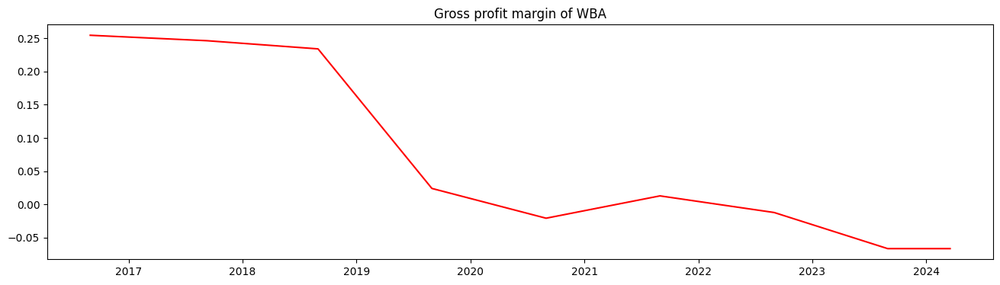

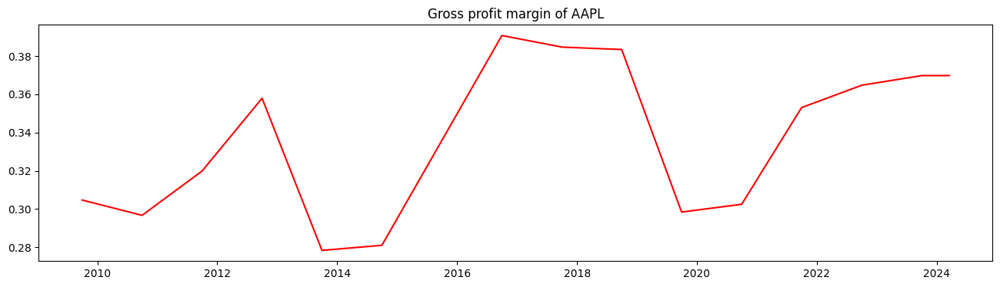

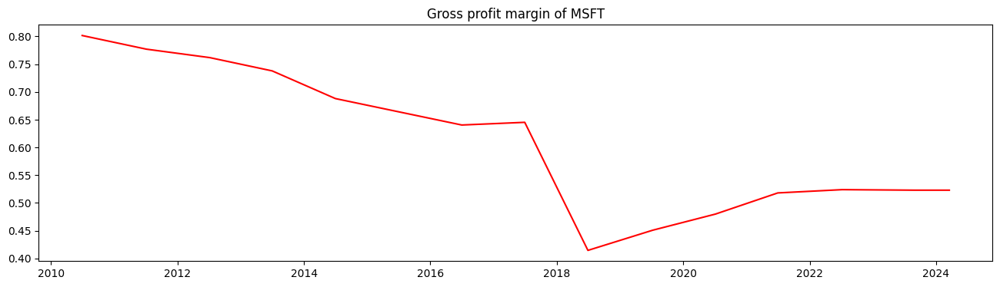

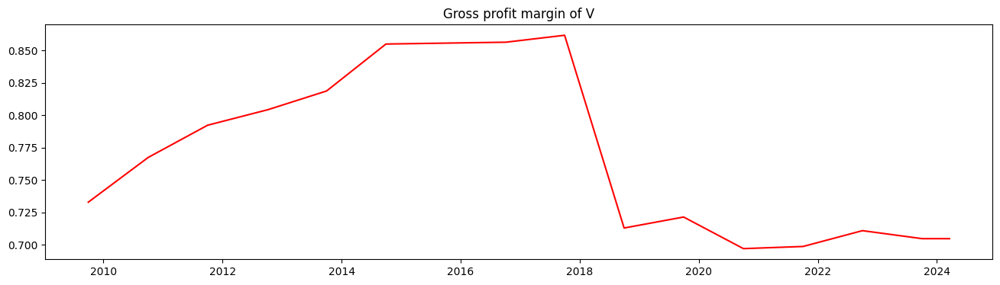

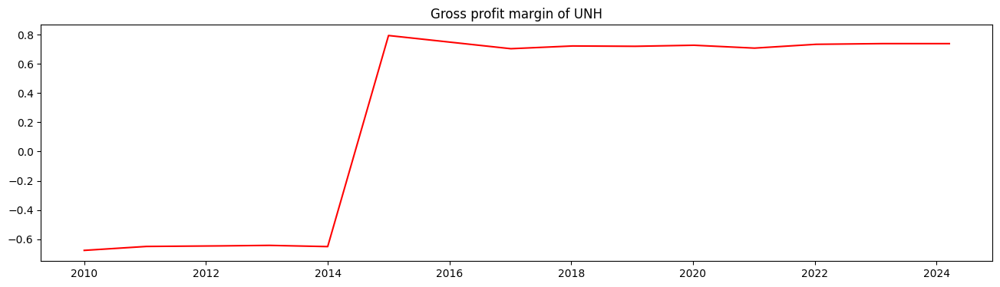

...

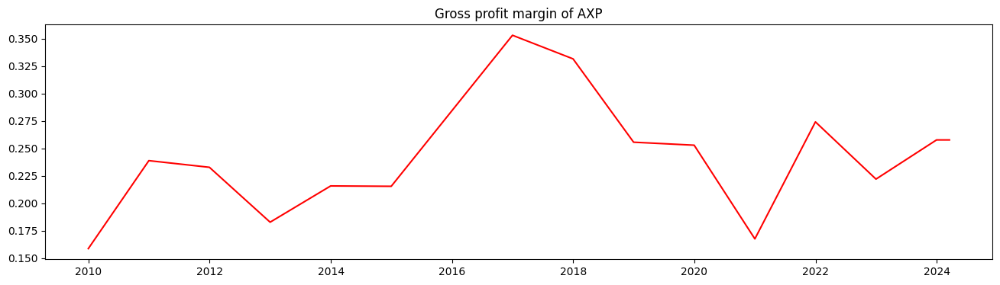

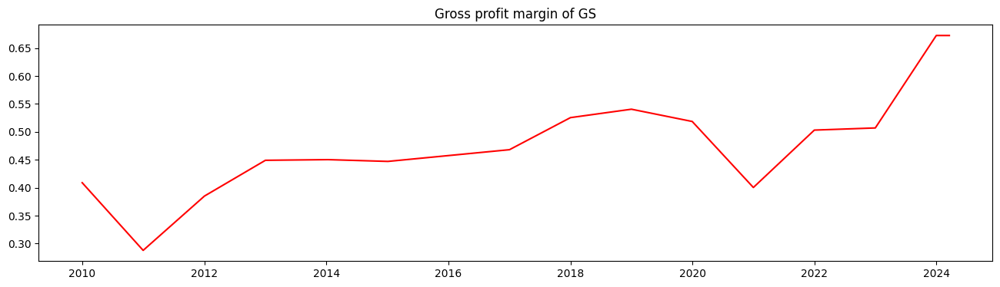

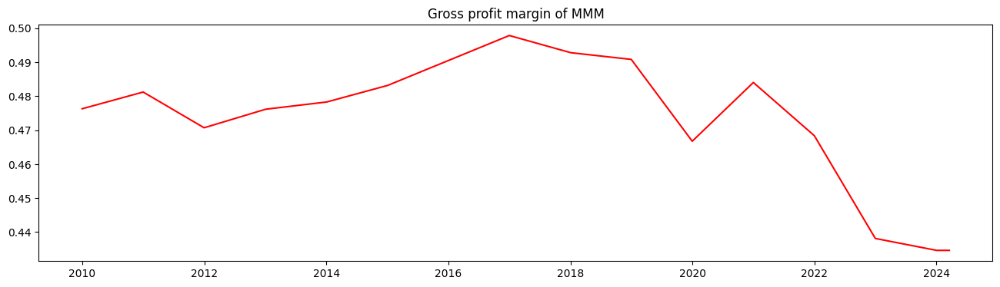

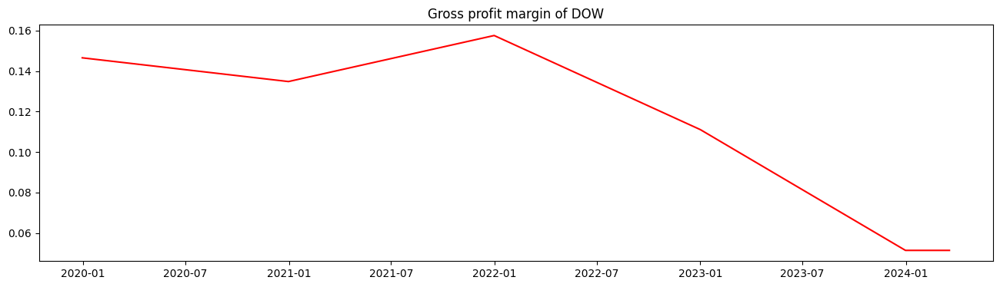

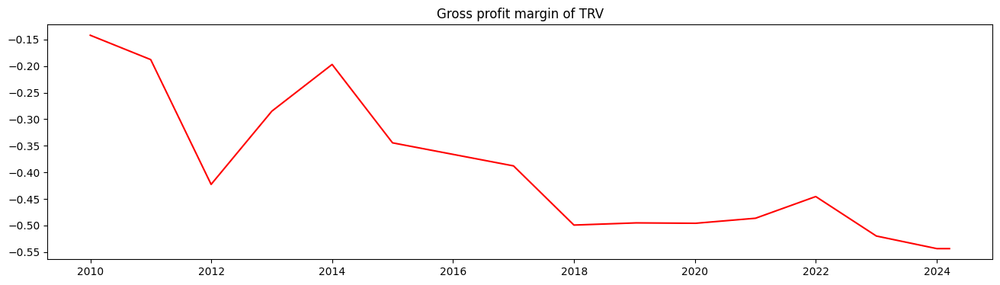

In [18]:
daily_ratios = pd.DataFrame()
for ticket in ratios.tic.unique():
    # Interpolate data for each ticket
    one_tic_ratios = pd.merge(date_range,ratios[ratios.tic == ticket],how="left",on=['date'])
    one_tic_ratios['tic'] = ticket
    one_tic_ratios = one_tic_ratios.interpolate('linear')
    daily_ratios = pd.concat([daily_ratios, one_tic_ratios], ignore_index=True)

    # Check data by drawing it out
    %matplotlib inline
    plt.figure(figsize=(16, 4)) 
    plt.plot(one_tic_ratios.date, one_tic_ratios.gross_profit_margin, color = 'red')
    plt.title(f'Gross profit margin of {ticket}')
    plt.show()

In [19]:
daily_ratios.dropna(subset='gross_profit_margin',inplace=True)
daily_ratios.reset_index(inplace=True,drop=True)
daily_ratios

,date,tic,totalRevenue,costOfRevenue,sellingGeneralAndAdministrative,researchAndDevelopment,depreciation,interestExpense,totalCurrentLiabilities,incomeTaxExpense,...,capital_cost_on_ebit,eps_on_mp,dividend_on_mp,mp_on_bv,trend_gross_margin,trend_profit_margin,fluc_sga,fluc_dep_ratio,fluc_inv_on_ebit,fluc_rec_on_rev
0,2016-08-31,WBA,1.173510e+11,8.747700e+10,2.391000e+10,0.0,1.300000e+09,5.960000e+08,1.701300e+10,9.970000e+08,...,0.222166,0.066571,4.476156e+07,-4.199883e-09,-0.001351,0.003741,0.018464,0.002538,0.245945,0.006433
1,2016-09-01,WBA,1.173534e+11,8.748132e+10,2.390973e+10,0.0,1.300000e+09,5.962658e+08,1.701720e+10,9.963507e+08,...,0.222250,0.066551,4.494381e+07,-4.198723e-09,-0.001358,0.003737,0.018455,0.002537,0.245832,0.006431
2,2016-09-02,WBA,1.173557e+11,8.748563e+10,2.390947e+10,0.0,1.300000e+09,5.965315e+08,1.702141e+10,9.957014e+08,...,0.222333,0.066531,4.512607e+07,-4.197562e-09,-0.001366,0.003733,0.018446,0.002536,0.245719,0.006429
3,2016-09-03,WBA,1.173581e+11,8.748995e+10,2.390920e+10,0.0,1.300000e+09,5.967973e+08,1.702561e+10,9.950521e+08,...,0.222416,0.066511,4.530832e+07,-4.196402e-09,-0.001373,0.003729,0.018436,0.002535,0.245606,0.006427
4,2016-09-04,WBA,1.173605e+11,8.749426e+10,2.390894e+10,0.0,1.300000e+09,5.970630e+08,1.702981e+10,9.944027e+08,...,0.222500,0.066490,4.549057e+07,-4.195241e-09,-0.001380,0.003725,0.018427,0.002534,0.245493,0.006424
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145112,2024-03-14,TRV,4.136400e+10,6.385300e+10,5.176000e+09,0.0,0.000000e+00,3.760000e+08,8.060000e+08,3.800000e+08,...,-0.000000,-0.653596,9.792584e+06,-2.961094e-09,-0.032695,-0.024844,0.026111,0.000000,1.261784,0.000347
145113,2024-03-15,TRV,4.136400e+10,6.385300e+10,5.176000e+09,0.0,0.000000e+00,3.760000e+08,8.060000e+08,3.800000e+08,...,-0.000000,-0.653596,9.792584e+06,-2.961094e-09,-0.032695,-0.024844,0.026111,0.000000,1.261784,0.000347
145114,2024-03-16,TRV,4.136400e+10,6.385300e+10,5.176000e+09,0.0,0.000000e+00,3.760000e+08,8.060000e+08,3.800000e+08,...,-0.000000,-0.653596,9.792584e+06,-2.961094e-09,-0.032695,-0.024844,0.026111,0.000000,1.261784,0.000347
145115,2024-03-17,TRV,4.136400e+10,6.385300e+10,5.176000e+09,0.0,0.000000e+00,3.760000e+08,8.060000e+08,3.800000e+08,...,-0.000000,-0.653596,9.792584e+06,-2.961094e-09,-0.032695,-0.024844,0.026111,0.000000,1.261784,0.000347


<a id='3.4'></a>
## 4.4 Merge stock price data and ratios into one dataframe
- Merge the price dataframe preprocessed in Part 3 and the ratio dataframe created in this part
- Since the prices are daily and ratios are quartely, we have NAs in the ratio columns after merging the two dataframes. We deal with this by backfilling the ratios.

In [21]:
# daily_ratios.drop(columns=['close'],inplace=True)
df_date = pd.DataFrame(df)[['date','tic','open','high','low','close','volume']]
df_date.columns = ['date','tic','open','high','low','close','volume']
df_date['date'] = pd.to_datetime(df_date.date)
final_ratios = pd.merge(daily_ratios,df_date,how="left",on=['date','tic'])
final_ratios

,date,tic,totalRevenue,costOfRevenue,sellingGeneralAndAdministrative,researchAndDevelopment,depreciation,interestExpense,totalCurrentLiabilities,incomeTaxExpense,...,trend_profit_margin,fluc_sga,fluc_dep_ratio,fluc_inv_on_ebit,fluc_rec_on_rev,open,high,low,close,volume
0,2016-08-31,WBA,1.173510e+11,8.747700e+10,2.391000e+10,0.0,1.300000e+09,5.960000e+08,1.701300e+10,9.970000e+08,...,0.003741,0.018464,0.002538,0.245945,0.006433,80.540001,80.830002,80.250000,60.654716,3282700.0
1,2016-09-01,WBA,1.173534e+11,8.748132e+10,2.390973e+10,0.0,1.300000e+09,5.962658e+08,1.701720e+10,9.963507e+08,...,0.003737,0.018455,0.002537,0.245832,0.006431,81.040001,81.709999,80.589996,61.278481,3296100.0
2,2016-09-02,WBA,1.173557e+11,8.748563e+10,2.390947e+10,0.0,1.300000e+09,5.965315e+08,1.702141e+10,9.957014e+08,...,0.003733,0.018446,0.002536,0.245719,0.006429,81.870003,82.250000,81.720001,61.789505,3029600.0
3,2016-09-03,WBA,1.173581e+11,8.748995e+10,2.390920e+10,0.0,1.300000e+09,5.967973e+08,1.702561e+10,9.950521e+08,...,0.003729,0.018436,0.002535,0.245606,0.006427,NaN,NaN,NaN,NaN,NaN
4,2016-09-04,WBA,1.173605e+11,8.749426e+10,2.390894e+10,0.0,1.300000e+09,5.970630e+08,1.702981e+10,9.944027e+08,...,0.003725,0.018427,0.002534,0.245493,0.006424,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145112,2024-03-14,TRV,4.136400e+10,6.385300e+10,5.176000e+09,0.0,0.000000e+00,3.760000e+08,8.060000e+08,3.800000e+08,...,-0.024844,0.026111,0.000000,1.261784,0.000347,222.889999,224.000000,220.449997,221.419998,1167800.0
145113,2024-03-15,TRV,4.136400e+10,6.385300e+10,5.176000e+09,0.0,0.000000e+00,3.760000e+08,8.060000e+08,3.800000e+08,...,-0.024844,0.026111,0.000000,1.261784,0.000347,219.470001,222.169998,219.470001,220.929993,2157600.0
145114,2024-03-16,TRV,4.136400e+10,6.385300e+10,5.176000e+09,0.0,0.000000e+00,3.760000e+08,8.060000e+08,3.800000e+08,...,-0.024844,0.026111,0.000000,1.261784,0.000347,NaN,NaN,NaN,NaN,NaN
145115,2024-03-17,TRV,4.136400e+10,6.385300e+10,5.176000e+09,0.0,0.000000e+00,3.760000e+08,8.060000e+08,3.800000e+08,...,-0.024844,0.026111,0.000000,1.261784,0.000347,NaN,NaN,NaN,NaN,NaN


In [23]:
final_ratios.dropna(subset=['close'],inplace=True,how='any')
final_ratios.reset_index(drop=True,inplace=True)
final_ratios.isna().sum()

date                               0
tic                                0
totalRevenue                       0
costOfRevenue                      0
sellingGeneralAndAdministrative    0
                                  ..
open                               0
high                               0
low                                0
close                              0
volume                             0
Length: 62, dtype: int64

In [24]:
def compute_market_ratios(df_final):
    
    market_equity = df_final.common_stock * df_final.close
    market_asset = df_final.total_liabilities + market_equity

    # ROA
    roa = (df_final.profit / market_asset).to_frame('roa')
    
    # ROE
    roe = (df_final.profit / market_equity).to_frame('roe')
    
    # Total Liabilities / Total Equity
    liabilities_on_equity = (df_final.total_liabilities / market_equity).to_frame('liabilities_on_equity')
    
    # EPS / MP
    eps_on_mp = (df_final.eps / df_final.close).to_frame('eps_on_mp')
    
    # Cash and Stock Dividend & Repurchase Common / MP
    dividend_on_mp = (df_final.dividend / market_equity).to_frame('dividend_on_mp')
    
    # MP / BV
    mp_on_bv = (market_equity / df_final.bv).to_frame('mp_on_bv')
    
    # Create a dataframe that merges all the ratios
    ratios = pd.concat([roa,roe,liabilities_on_equity,eps_on_mp,dividend_on_mp,mp_on_bv], axis=1)
    
    return ratios

In [25]:
market_ratios = compute_market_ratios(final_ratios)

In [26]:
ratios = final_ratios.drop(columns=['roa','roe','liabilities_on_equity','eps_on_mp','dividend_on_mp','mp_on_bv'])
ratios = pd.concat([ratios,market_ratios],axis=1)
ratios.drop(columns=['profit', 'common_stock', 'total_liabilities','eps', 'dividend', 'bv'],inplace=True)

In [27]:
ratios.columns

Index(['date', 'tic', 'totalRevenue', 'costOfRevenue',
       'sellingGeneralAndAdministrative', 'researchAndDevelopment',
       'depreciation', 'interestExpense', 'totalCurrentLiabilities',
       'incomeTaxExpense', 'netIncome', 'commonStockSharesOutstanding',
       'cashAndCashEquivalentsAtCarryingValue', 'cashAndShortTermInvestments',
       'operatingCashflow', 'totalLiabilities', 'inventory',
       'currentNetReceivables', 'propertyPlantEquipment',
       'capitalExpenditures', 'longTermInvestments', 'totalShareholderEquity',
       'longTermDebt', 'retainedEarnings', 'dividendPayoutCommonStock',
       'paymentsForRepurchaseOfCommonStock', 'treasuryStock',
       'currentLongTermDebt', 'gross_profit_margin', 'sga_ratio', 'dep_ratio',
       'ebit_on_int', 'profit_margin', 'count_positive_profit',
       'csti_on_liabilities', 'inventory_on_ebit', 'receivable_on_rev',
       'debt_on_min_ebit', 'capital_cost_on_ebit', 'trend_gross_margin',
       'trend_profit_margin', 'fluc_s

In [31]:
ratios = ratios[['date', 'tic', 'totalRevenue', 'costOfRevenue',
           'sellingGeneralAndAdministrative', 'researchAndDevelopment',
           'depreciation', 'interestExpense', 'totalCurrentLiabilities',
           'incomeTaxExpense', 'netIncome', 'commonStockSharesOutstanding',
           'cashAndCashEquivalentsAtCarryingValue', 'cashAndShortTermInvestments',
           'operatingCashflow', 'totalLiabilities', 'inventory',
           'currentNetReceivables', 'propertyPlantEquipment',
           'capitalExpenditures', 'longTermInvestments', 'totalShareholderEquity',
           'longTermDebt', 'retainedEarnings', 'dividendPayoutCommonStock',
           'paymentsForRepurchaseOfCommonStock', 'treasuryStock',
           'currentLongTermDebt', 'gross_profit_margin', 'sga_ratio', 'dep_ratio',
           'ebit_on_int', 'profit_margin', 'count_positive_profit',
           'csti_on_liabilities', 'inventory_on_ebit', 'receivable_on_rev',
           'debt_on_min_ebit', 'capital_cost_on_ebit', 'trend_gross_margin',
           'trend_profit_margin', 'fluc_sga', 'fluc_dep_ratio', 'fluc_inv_on_ebit',
           'fluc_rec_on_rev', 'roa', 'roe', 'liabilities_on_equity', 'eps_on_mp', 'dividend_on_mp',
           'mp_on_bv', 'open', 'high', 'low', 'close', 'volume']]

In [32]:
ratios.to_csv('./' + DATA_SAVE_DIR + '/dow30_ready_daily_forGame.csv')

<a id='3.5'></a>
## 4.5 Finish data preparation

<a id='3.5.1'></a>
### 4.5.1 Load available data

In [6]:
# If the data is available in the data storage, load processed_full from readied data
processed_full = pd.read_csv('./' + DATA_SAVE_DIR + '/dow30_ready_daily_forGame.csv',index_col=0)
processed_full['date'] = pd.to_datetime(processed_full.date,format='mixed')
processed_full.info()

<class 'pandas.core.frame.DataFrame'>
Index: 99956 entries, 0 to 99955
Data columns (total 56 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   date                                   99956 non-null  datetime64[ns]
 1   tic                                    99956 non-null  object        
 2   totalRevenue                           99956 non-null  float64       
 3   costOfRevenue                          99956 non-null  float64       
 4   sellingGeneralAndAdministrative        99956 non-null  float64       
 5   researchAndDevelopment                 99956 non-null  float64       
 6   depreciation                           99956 non-null  float64       
 7   interestExpense                        99956 non-null  float64       
 8   totalCurrentLiabilities                99956 non-null  float64       
 9   incomeTaxExpense                       99956 non-null  float64    

<a id='3.5.2'></a>
### 4.5.2 Split data into tickers

In [7]:
processed_full

,date,tic,totalRevenue,costOfRevenue,sellingGeneralAndAdministrative,researchAndDevelopment,depreciation,interestExpense,totalCurrentLiabilities,incomeTaxExpense,...,roe,liabilities_on_equity,eps_on_mp,dividend_on_mp,mp_on_bv,open,high,low,close,volume
0,2016-08-31,WBA,1.173510e+11,8.747700e+10,2.391000e+10,0.0,1.300000e+09,5.960000e+08,1.701300e+10,9.970000e+08,...,0.066571,0.651977,0.066571,0.041350,-4.546374,80.540001,80.830002,80.250000,60.654716,3282700.0
1,2016-09-01,WBA,1.173534e+11,8.748132e+10,2.390973e+10,0.0,1.300000e+09,5.962658e+08,1.701720e+10,9.963507e+08,...,0.065879,0.645209,0.065878,0.041107,-4.590999,81.040001,81.709999,80.589996,61.278481,3296100.0
2,2016-09-02,WBA,1.173557e+11,8.748563e+10,2.390947e+10,0.0,1.300000e+09,5.965315e+08,1.702141e+10,9.957014e+08,...,0.065319,0.639742,0.065318,0.040943,-4.627141,81.870003,82.250000,81.720001,61.789505,3029600.0
3,2016-09-06,WBA,1.173652e+11,8.750289e+10,2.390841e+10,0.0,1.300000e+09,5.975945e+08,1.703822e+10,9.931041e+08,...,0.065723,0.643761,0.065721,0.041943,-4.585998,82.050003,82.139999,81.199997,61.353630,3726000.0
4,2016-09-07,WBA,1.173676e+11,8.750721e+10,2.390814e+10,0.0,1.300000e+09,5.978603e+08,1.704242e+10,9.924548e+08,...,0.064725,0.634000,0.064722,0.041490,-4.653500,81.820000,83.059998,81.410004,62.285503,3315900.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99951,2024-03-12,TRV,4.136400e+10,6.385300e+10,5.176000e+09,0.0,0.000000e+00,3.760000e+08,8.060000e+08,3.800000e+08,...,-0.564929,2.008727,-0.564929,0.037091,-0.781778,218.669998,221.259995,217.600006,220.460007,2025300.0
99952,2024-03-13,TRV,4.136400e+10,6.385300e+10,5.176000e+09,0.0,0.000000e+00,3.760000e+08,8.060000e+08,3.800000e+08,...,-0.557270,1.981494,-0.557270,0.036588,-0.792523,220.960007,223.600006,220.679993,223.490005,1047500.0
99953,2024-03-14,TRV,4.136400e+10,6.385300e+10,5.176000e+09,0.0,0.000000e+00,3.760000e+08,8.060000e+08,3.800000e+08,...,-0.562480,2.000018,-0.562480,0.036930,-0.785182,222.889999,224.000000,220.449997,221.419998,1167800.0
99954,2024-03-15,TRV,4.136400e+10,6.385300e+10,5.176000e+09,0.0,0.000000e+00,3.760000e+08,8.060000e+08,3.800000e+08,...,-0.563727,2.004454,-0.563727,0.037012,-0.783445,219.470001,222.169998,219.470001,220.929993,2157600.0


In [12]:
format_str = '%Y-%m-%d'
processed_full['date'] = processed_full.date.dt.strftime(format_str)

In [14]:
for tic in processed_full.tic.unique():
    tic_data = processed_full[processed_full.tic == tic]
    # tic_data = tic_data[tic_data.date.dt.year >=2021]
    tic_data = tic_data.reset_index(drop=True)
    tic_data.to_json(path_or_buf='./' + DATA_SAVE_DIR + '/' + tic + '_ready_daily_forGame.json', orient='records')

In [15]:
import json

for tic in processed_full.tic.unique():
    with open('./' + DATA_SAVE_DIR + '/' + tic + '_ready_daily_forGame.json', "r") as json_file:
        json_data = json.load(json_file)
    json_data = {"data":json_data}
    with open('./' + DATA_SAVE_DIR + '/' + tic + '_ready_daily_forGame.json', "w") as json_file:
        json.dump(json_data, json_file, indent=4)

In [16]:
json_data

{'data': [{'date': '2009-12-31',
   'tic': 'TRV',
   'totalRevenue': 24680000000.0,
   'costOfRevenue': 28182000000.0,
   'sellingGeneralAndAdministrative': 3366000000.0,
   'researchAndDevelopment': 0.0,
   'depreciation': 0.0,
   'interestExpense': 382000000.0,
   'totalCurrentLiabilities': 523000000.0,
   'incomeTaxExpense': 1089000000.0,
   'netIncome': 3622000000.0,
   'commonStockSharesOutstanding': 520300000.0,
   'cashAndCashEquivalentsAtCarryingValue': 255000000.0,
   'cashAndShortTermInvestments': 5107000000.0,
   'operatingCashflow': 4231000000.0,
   'totalLiabilities': 82145000000.0,
   'inventory': -264000000.0,
   'currentNetReceivables': 0.0,
   'propertyPlantEquipment': 0.0,
   'capitalExpenditures': 0.0,
   'longTermInvestments': 75790000000.0,
   'totalShareholderEquity': 27415000000.0,
   'longTermDebt': 6154000000.0,
   'retainedEarnings': 16315000000.0,
   'dividendPayoutCommonStock': 693000000.0,
   'paymentsForRepurchaseOfCommonStock': 0.0,
   'treasuryStock': 97

In [55]:
with open('./' + DATA_SAVE_DIR + '/AAPL_ready_daily_forGame.json', "r") as json_file:
    json_data = json.load(json_file)
json_data

[{'date': 1254268800000,
  'tic': 'AAPL',
  'totalRevenue': 42905000000.0,
  'costOfRevenue': 29832000000.0,
  'sellingGeneralAndAdministrative': 4149000000.0,
  'researchAndDevelopment': 1333000000.0,
  'depreciation': 0.0,
  'interestExpense': 326000000.0,
  'totalCurrentLiabilities': 11506000000.0,
  'incomeTaxExpense': 3831000000.0,
  'netIncome': 8235000000.0,
  'commonStockSharesOutstanding': 899805500.0,
  'cashAndCashEquivalentsAtCarryingValue': 5263000000.0,
  'cashAndShortTermInvestments': 23464000000.0,
  'operatingCashflow': 10159000000.0,
  'totalLiabilities': 15861000000.0,
  'inventory': 455000000.0,
  'currentNetReceivables': 3361000000.0,
  'propertyPlantEquipment': 1780000000.0,
  'capitalExpenditures': 1144000000.0,
  'longTermInvestments': 10528000000.0,
  'totalShareholderEquity': 31640000000.0,
  'longTermDebt': 0.0,
  'retainedEarnings': 23353000000.0,
  'dividendPayoutCommonStock': 0.0,
  'paymentsForRepurchaseOfCommonStock': 0.0,
  'treasuryStock': 0.0,
  'curr

<a id='4.1'></a>
## 5.1 Training & Trade Data Split
- Training data period: 2009-01-01 to 2020-01-01
- Trade data period: 2020-01-01 to 2023-12-29

In [58]:
train_data = data_split(processed_full, TRAIN_START_DATE, TRAIN_END_DATE)
test_data = data_split(processed_full, TEST_START_DATE, TEST_END_DATE)
# Check the length of the two datasets
print(len(train_data))
print(len(test_data))

75776
24150


In [59]:
train_data = train_data.reset_index(drop=True)
train_data

,date,tic,close,gross_profit_margin,sga_ratio,dep_ratio,ebit_on_int,profit_margin,count_positive_profit,csti_on_liabilities,...,capital_cost_on_ebit,eps_on_mp,dividend_on_mp,mp_on_bv,trend_gross_margin,trend_profit_margin,fluc_sga,fluc_dep_ratio,fluc_inv_on_ebit,fluc_rec_on_rev
0,2009-09-30,AAPL,5.604187,0.304696,0.317372,0.000000,27.374233,0.111106,1.0,1.479352,...,0.128194,0.945331,0.000000,0.235603,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,2009-09-30,V,15.578794,0.732890,0.247976,0.000000,33.121739,0.296050,1.0,0.670885,...,0.080336,0.155239,0.224892,-13.049168,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,2009-10-01,AAPL,5.468429,0.304696,0.317372,0.000000,27.374233,0.111106,1.0,1.479352,...,0.128194,0.968800,0.000000,0.229896,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,2009-10-01,V,15.581048,0.732890,0.247976,0.000000,33.121739,0.296050,1.0,0.670885,...,0.080336,0.155217,0.224859,-13.051056,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,2009-10-02,AAPL,5.590579,0.304696,0.317372,0.000000,27.374233,0.111106,1.0,1.479352,...,0.128194,0.947632,0.000000,0.235031,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75771,2020-12-31,UNH,335.059784,0.707009,0.229394,0.005501,84.243536,0.519019,1.0,0.156063,...,0.014640,0.421057,0.027870,-7.256793,-0.004108,-0.009259,0.010702,0.000112,0.000000,0.007124
75772,2020-12-31,V,213.664169,0.697015,0.135746,0.000000,25.503876,0.444933,1.0,0.468250,...,0.055927,0.023462,0.026015,-20.847330,-0.005308,-0.004422,0.007067,0.000000,0.030558,0.007428
75773,2020-12-31,VZ,48.816624,0.618534,0.397880,0.179892,11.250294,0.295529,1.0,0.078657,...,0.425241,0.187464,0.050592,-0.918847,0.008299,0.001245,0.344847,0.183250,0.262024,0.020318
75774,2020-12-31,WBA,33.866371,-0.020759,-8.816638,-0.000000,-46.200653,-0.210637,0.5,0.007814,...,-0.048515,-0.997539,0.113681,-0.638485,-0.084951,-0.081575,5.124374,0.170724,0.957326,0.001800


In [60]:
test_data = test_data.reset_index(drop=True)
test_data

,date,tic,close,gross_profit_margin,sga_ratio,dep_ratio,ebit_on_int,profit_margin,count_positive_profit,csti_on_liabilities,...,capital_cost_on_ebit,eps_on_mp,dividend_on_mp,mp_on_bv,trend_gross_margin,trend_profit_margin,fluc_sga,fluc_dep_ratio,fluc_inv_on_ebit,fluc_rec_on_rev
0,2021-01-04,AAPL,127.002121,0.302483,0.242384,0.118052,21.667595,0.182954,0.8,0.351744,...,0.117412,0.023050,0.040091,-78.748723,-0.026985,-0.025013,0.035323,0.021199,0.015160,0.020108
1,2021-01-04,AMGN,204.389359,0.711178,0.316907,0.035396,9.786846,0.401982,0.9,0.207774,...,0.049227,0.086465,0.061261,-3.354906,-0.021668,-0.014193,0.013963,0.000613,0.039779,0.030312
2,2021-01-04,AXP,113.141533,0.167448,1.766343,0.000000,-2.335558,-0.213670,0.3,0.193107,...,-0.301633,-0.089582,0.027482,-1.219843,-0.029402,-0.039362,0.385584,0.000000,364.422681,0.000000
3,2021-01-04,BA,202.720001,-0.097751,-0.847318,-0.000000,-4.606140,-0.176192,0.6,0.150402,...,-0.124072,-0.049935,0.005643,-1.532689,-0.097311,-0.102577,0.555834,0.000000,7.065236,0.032420
4,2021-01-04,CAT,170.039978,0.303392,0.366493,0.167535,15.610895,0.155792,1.0,0.148572,...,0.263584,0.070145,0.036377,-4.989979,-0.006839,-0.009867,0.042355,0.045383,0.215693,0.153542
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24145,2024-03-15,UNH,490.820007,0.737986,0.199189,0.004011,67.659889,0.566194,1.0,0.169496,...,0.015417,0.463951,0.032548,-7.233368,0.001578,0.000894,0.011733,0.000605,0.008096,0.005380
24146,2024-03-15,V,283.040009,0.704715,0.118495,0.000000,-30.854037,0.523667,0.9,0.314608,...,0.053296,0.032006,0.030290,-18.368062,0.002031,0.031220,0.007648,0.000000,0.041603,0.004438
24147,2024-03-15,VZ,39.490002,0.567685,0.430544,0.196397,7.840333,0.245525,1.0,0.006308,...,0.567144,0.197527,0.066205,-0.592971,-0.041101,-0.051329,0.044281,0.015424,0.008032,0.006570
24148,2024-03-15,WBA,20.820000,-0.066540,-3.659463,-0.000000,-75.089655,-0.300945,0.5,0.010845,...,-0.048609,-2.351420,0.100623,-0.337370,-0.026463,-0.038501,11.245682,0.183206,0.089938,0.006425


<a id='4.2'></a>
## 5.2 Set up the training environment

Describe the environment: 

Our trading environments, based on OpenAI Gym framework, simulate live stock markets with real market data according to the principle of time-driven simulation.

* Action: The action space describes the allowed actions that the agent interacts with the environment. Normally, a ∈ A includes three actions: a ∈ {−1, 0, 1}, where −1, 0, 1 represent selling, holding, and buying one stock. However, because StableBaseline does not support {-1,0,1} as int for discrete space, we might turn the space to {0,1,2}. For example, "Buy AAPL with all the current capital" or "Sell all available AAPL" are 1 or -1, respectively.

* Reward function: r(s, a, s′) is the incentive mechanism for an agent to learn a better action. The surplus when selling stocks address reward for each deal indicate total reward of the trading. To enforce the agent learn something, a punishment is applied at the begining of each step. Additionally, punishments also employ to keep the agent away from deciding unavailable buying and selling. In this version, the capital gain at the end of each episode will not be taken into account in computing step's rewards.

* State: The state space describes the observations that the agent receives from the environment. Just as a human trader needs to analyze various information before executing a trade, so our trading agent observes many different features to better learn in an interactive environment.

* Environment: Dow 30 consituents

In [61]:
import gymnasium as gym
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import random

from gymnasium import spaces
from gymnasium.utils import seeding
from stable_baselines3.common.vec_env import DummyVecEnv
from portfolio import portfolio

matplotlib.use("Agg")

# from stable_baselines3.common import logger


class StockTradingEnv(gym.Env):
    """A stock trading environment for OpenAI gym"""

    metadata = {"render.modes": ["human"]}

    def __init__(
        self,
        df,
        hmax,
        initial_amount,
        buy_cost_pct,
        sell_cost_pct,
        reward_scaling,
        state_space,
        action_space,
        tech_indicator_list,
        stop_loss,
        hold_period,
        make_plots=False,
        print_verbosity=10,
        row=0,
        initial=True,
        previous_state=[],
        model_name="",
        mode="",
        iteration="",
    ):
        # self.row = row
        self.df = df
        # self.stock_dim = stock_dim
        self.hmax = hmax
        self.reward_scaling = reward_scaling
        self.state_space = state_space
        self.action_space = action_space
        self.tech_indicator_list = tech_indicator_list        
        self.initial_amount = initial_amount
        self.hold_period = hold_period
        self.buy_cost_pct = buy_cost_pct
        self.sell_cost_pct = sell_cost_pct
        self.stop_loss = stop_loss # the game stops when the asset loses more than stop_loss percent
        self.action_space = spaces.Box(low=-1, high=1, shape=(self.action_space,))
        self.observation_space = spaces.Box(low=-np.inf, high=np.inf, shape=(self.state_space,))
        self.terminal = False
        self.make_plots = make_plots
        self.print_verbosity = print_verbosity
        # self.turbulence_threshold = turbulence_threshold
        # self.risk_indicator_col = risk_indicator_col
        self.initial = initial
        self.previous_state = previous_state
        self.model_name = model_name
        self.mode = mode
        self.iteration = iteration
        self.tic_list = self.df.tic.unique()
        self.original_df = self.df.copy()
        self.row = 0
        
        # initalize state
        self.state = self._initiate_state()

        # initialize reward
        self.reward = 0
        self.turbulence = 0
        self.cost = 0
        self.trades = 0
        self.episode = 0
        
        # memorize all the total balance change
        self.asset_memory = [self.initial_amount]
        self.rewards_memory = []
        self.actions_memory = []
        self.date_memory = [self._get_date()]
        # self.reset()
        self._seed()

    def _buy_stock(self, action):
        def _do_buy():
            if self.data.close > 0: # Buy only if the price is > 0 (no missing data in this particular date)
                buy_num_shares, buy_fee = self.portfolio.add_buy_stock(self.data.tic,self.data.close,action)
                # print(f'Buy amount: {buy_num_shares}')
                self.cost += buy_fee
                if buy_num_shares == 0:
                    self.reward = -5 * self.initial_amount * self.punishment_rate * self.reward_scaling
            else:
                buy_num_shares = 0

            return buy_num_shares

        buy_num_shares = _do_buy()
        return buy_num_shares
    
    def _sell_stock(self, action):
        def _do_sell_normal():
            if self.data.close > 0: # Sell only if the price is > 0 (no missing data in this particular date)
                sell_amount,surplus,sell_fee = self.portfolio.minus_sell_stock(self.data.tic,self.data.close,action)
                self.cost += sell_fee
                # print(f'Sell amount: {sell_num_shares}')
                if sell_amount == 0:
                    self.reward = -5 * self.initial_amount * self.punishment_rate * self.reward_scaling
                else:
                    self.reward += (surplus - sell_amount*self.data.close*self.sell_cost_pct) * self.reward_scaling
                    self.win_trade += 1 if surplus > 0 else 0
                    self.trades += 1
            else:
                sell_amount = 0

            return sell_amount

        sell_amount = _do_sell_normal()
        return sell_amount

    def step(self, actions):

        self.terminal = (self.row >= len(self.df.index.unique()) - 1) | (self.portfolio.get_asset_value() < self.initial_amount*(1-self.stop_loss))
        # print(f'Step {self.row}, action: {actions}, current asset: {current_total_asset}, stop loss: {self.initial_amount*(1-self.stop_loss)}, Trade: {self.trades}')

        # Reset reward to zero
        self.reward = 0
        
        # --> IN CASE THE STEP IS A TERMINATED STEP
        if self.terminal: 
            
            # Summary the training performance after an episode
            end_total_asset = self.portfolio.get_asset_value()
            tot_reward = end_total_asset - self.initial_amount * (self.df.iloc[-1].close / self.df.iloc[0].close) # compare with buy-and-hold strategy
            # tot_reward = end_total_asset - self.initial_amount # compare with initial capital

            # Show at each episode
            print(f"Episode: {self.episode}, com: {self.df.iloc[0].tic}, win trade: {self.win_trade}/{self.trades}, Total reward: {self.accumulated_reward}")

            # Print out training results after a certain amount of episodes
            if self.episode % self.print_verbosity == 0:
                print(f"Current company: {self.df.iloc[0].tic}")
                print(f"begin_total_asset: {self.asset_memory[0]:0.2f}")
                print(f"end_total_asset: {end_total_asset:0.2f}")
                print(f"surplus from buy-and-hold: {tot_reward:0.2f}")
                print(f"total_cost: {self.cost:0.2f}")
                print(f"total_trades: {self.trades}")
                # if df_total_value["daily_return"].std() != 0:
                #     print(f"Sharpe: {sharpe:0.3f}")
                print("=================================")
            
            truncated = False  # we do not limit the number of steps here
            # Optionally we can pass additional info, we are not using that for now
            info = {}


            return (
                np.array(self.state).astype(np.float32),
                self.reward,
                self.terminal,
                truncated,
                info,
            )

        # --> IN A NORMAL STEP
        else: 

            # Act according to actions
            action = actions[0]
                
            if action > 0:
                self._buy_stock(action)
            elif action < 0:
                self._sell_stock(action)

            self.current_actions = actions
            self.actions_memory.append(actions)

            # Set a punishment at each step to push the agent decide an action
            self.reward += -1 * self.initial_amount * self.punishment_rate * self.reward_scaling
            self.accumulated_reward += self.reward

            # Update selected row in the dataset based on state: s -> s+1
            self.row += 1
            self.data = self.df.loc[self.row]
            self.state = self._update_state()

            end_total_asset = self.portfolio.get_asset_value()

            # Update asset memory
            self.current_asset = end_total_asset
            self.asset_memory.append(end_total_asset)
            self.date_memory.append(self._get_date())
            
            self.rewards_memory.append(self.reward)

        truncated = False  # we do not limit the number of steps here
        # Optionally we can pass additional info, we are not using that for now
        info = {}
        
        # return self.state, self.reward, self.terminal, {}
    
        return (
            np.array(self.state).astype(np.float32),
            self.reward,
            self.terminal,
            truncated,
            info,
        )

    def reset(self, seed=None, options=None):
        # initiate state
        self.state = self._initiate_state()

        # Reset asset_memory
        self.asset_memory = [self.initial_amount]

        # Reset support variables
        self.cost = 0
        self.trades = 0
        self.win_trade = 0
        self.terminal = False
        self.accumulated_reward = 0
        self.block_remain = 0
        self.rewards_memory = []
        self.actions_memory = []
        self.date_memory = [self._get_date()]
        self.episode += 1

        return np.array(self.state).astype(np.float32), {}

    def render(self, mode="human", close=False):
        return self.state

    def _initiate_state(self):
        
        # Reset portfolio & previous_portfolio
        self.portfolio = portfolio(initial_amount=self.initial_amount,hold_period=self.hold_period,
                                   buy_cost_pct=self.buy_cost_pct,sell_cost_pct=self.sell_cost_pct)

        # Select a random ticker from df
        self.df = self.original_df[self.original_df.tic == random.choice(self.tic_list)].reset_index(drop=True)
        self.punishment_rate = 1/(len(self.df)*10)
        
        # Reset data
        self.row = 0
        self.data = self.df.loc[self.row]
        
         # Reset state
        state = ([self.portfolio.get_remain_capital()] + [self.data.close] 
                    + [self.portfolio.get_stock_weight(self.data.tic)] 
                    +[self.portfolio.get_stock_profit(self.data.tic)]
                    + sum([[self.data[tech]] for tech in self.tech_indicator_list], []))
        
        return state

    def _update_state(self):

        self.portfolio.update_new_state(self.data.tic,self.data.close)
        state = ([self.portfolio.get_remain_capital()] + [self.data.close] 
                    + [self.portfolio.get_stock_amount(self.data.tic)]
                    +[self.portfolio.get_stock_profit(self.data.tic)]
                    + sum([[self.data[tech]] for tech in self.tech_indicator_list], []))

        return state

    def _get_date(self):
        return self.row

    def save_asset_memory(self):
        date_list = self.date_memory
        asset_list = self.asset_memory
        df_account_value = pd.DataFrame({"date": date_list, "account_value": asset_list})
        return df_account_value

    def save_action_memory(self):
        
        date_list = self.date_memory[:-1]
        action_list = self.actions_memory
        df_actions = pd.DataFrame({"date": date_list, "actions": action_list})
        return df_actions

    def _seed(self, seed=None):
        self.np_random, seed = seeding.np_random(seed)
        return [seed]

    def get_sb_env(self):
        e = DummyVecEnv([lambda: self])
        obs = e.reset()
        return e, obs

<a id='4.3'></a>
## 5.3 Initialize Environment


State's space include remain_capital, price, stock_amount, current_return, and the indicators decided in ratio_list

In [62]:
features = [ 'gross_profit_margin', 'sga_ratio', 'ebit_on_int', 'profit_margin', 'count_positive_profit',
       'csti_on_liabilities', 'roa', 'roe', 'liabilities_on_equity', 'debt_on_min_ebit',
       'capital_cost_on_ebit', 'eps_on_mp', 'dividend_on_mp', 'mp_on_bv',
       'trend_gross_margin', 'trend_profit_margin', 'fluc_sga', 'fluc_dep_ratio', 'fluc_inv_on_ebit', 'fluc_rec_on_rev']
# ratio_list = train_data.columns.drop(['date','tic','close'])

action_dimension = 1 # k float in range (-1,1) to decide sell (k<0) or buy (k>0) decisions
state_space = 4 + len(features)
print(f"Action Dimension: {action_dimension}, State Space: {state_space}")

Action Dimension: 1, State Space: 24


#### Initiate environment

In [63]:
# Parameters for the environment
env_kwargs = {
    "hmax": 100, 
    "initial_amount": 1000000, 
    "buy_cost_pct": 0.001,
    "sell_cost_pct": 0.001,
    "tech_indicator_list": features, 
    "state_space": state_space, 
    "action_space": action_dimension, 
    "reward_scaling": 1e-4,
    "stop_loss": 0.8,
    "print_verbosity":4,
    "hold_period": 5
}

#Establish the training environment using StockTradingEnv() class
e_train_gym = StockTradingEnv(df = train_data, **env_kwargs)

In [64]:
from stable_baselines3.common.env_checker import check_env

# If the environment don't follow the interface, an error will be thrown
check_env(e_train_gym, warn=True)

In [65]:
from stable_baselines3 import PPO, A2C, DQN, DDPG

# Instantiate the env
env_train, _ = e_train_gym.get_sb_env()
print(type(env_train))

<class 'stable_baselines3.common.vec_env.dummy_vec_env.DummyVecEnv'>


<a id='8.1'></a>
#### If the training starts from the previous model, the section should **run all cells above** this line and then jump to [**Load trained model**](#7.2.1) to keep the traning going on.

#### Test Environment

In [80]:
# Get samples from train_data
test_env_data = train_data

#Establish the training environment using StockTradingEnv() class
test_train_gym = StockTradingEnv(df = test_env_data, **env_kwargs)

# test reset state
print(test_train_gym.reset())

(array([ 1.0000000e+06,  1.2912306e+02,  0.0000000e+00,  0.0000000e+00,
        7.9819560e-01,  2.0786537e-01,  3.5321831e+01,  5.7090521e-01,
        6.9999999e-01,  5.1547471e-02,  1.1760028e-01,  1.7069367e-01,
        4.5147333e-01,  1.4380682e+00,  1.1079048e-01,  1.7069367e-01,
        1.2435093e-02, -3.0260425e+00,  0.0000000e+00,  0.0000000e+00,
        0.0000000e+00,  0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
      dtype=float32), {})


In [81]:
for i in range(0,3000):
    action = test_train_gym.action_space.sample()
    # print(test_train_gym.data)
    state,reward,terminal,truncated,info = test_train_gym.step(action)
    
    print(f'Step {test_train_gym.row}, action: {action[0]}, asset: {test_train_gym.current_asset}, reward: {test_train_gym.reward}, Trade: {test_train_gym.trades}')
    # print(f'{test_train_gym.punishment_rate}')
    print(f'Price: {test_train_gym.data.close},State:{test_train_gym.state[:4]}')
    print(f'{test_train_gym.portfolio.portfolio}\n')
    
    if terminal:
        test_train_gym.reset()

Step 1, action: -0.05336547642946243, asset: 1000000.0, reward: -0.18867924528301885, Trade: 0
Price: 128.36012268066406,State:[1000000.0, 128.36012268066406, 0, 0]
   tic      price  buy_price  amount  weight  hold_on
0  cap  1000000.0  1000000.0       1     1.0        0

Step 2, action: 0.9418039321899414, asset: 996077.1428887635, reward: -0.031446540880503145, Trade: 0
Price: 127.95388793945312,State:[57151.51318905642, 127.95388793945312, 0, 0.996835195131267]
   tic         price       buy_price  amount    weight  hold_on
0  cap  57151.513189  1000000.000000       1  0.057377        0
1  DIS    127.953888      128.360123    7338  0.942623        4

Step 3, action: 0.6301988363265991, asset: 988566.4579941712, reward: -0.031446540880503145, Trade: 0
Price: 126.97296905517578,State:[21032.433793731718, 126.97296905517578, 0, 0.9893091371533516]
   tic         price       buy_price  amount    weight  hold_on
0  cap  21032.433794  1000000.000000       1  0.021276        0
1  DIS    1

Define callback function for the training

In [69]:
from stable_baselines3.common.callbacks import BaseCallback

class TensorboardCallback(BaseCallback):
    """
    Custom callback for plotting additional values in tensorboard.
    """

    def __init__(self, verbose=0):
        super().__init__(verbose)

    def _on_step(self) -> bool:
        try:
            self.logger.record(key="train/reward", value=self.locals["rewards"][0])

        except BaseException as error:
            try:
                self.logger.record(key="train/reward", value=self.locals["reward"][0])

            except BaseException as inner_error:
                # Handle the case where neither "rewards" nor "reward" is found
                self.logger.record(key="train/reward", value=None)
                # Print the original error and the inner error for debugging
                print("Original Error:", error)
                print("Inner Error:", inner_error)
        return True

In [70]:
policy_kwargs = dict(net_arch=dict(pi=[128,64, 32, 16], vf=[128,64, 32, 16]))
# policy_kwargs = dict(net_arch=dict(pi=[64,64,64], vf=[64,64,64]))
total_training_step = 2000000

In [71]:
try:
  trained_model
except NameError:
    print('No any model')
else:
    print('Ready for keeping training')

Ready for keeping training


In [72]:
try:
  trained_model
except NameError:
    trained_ppo = PPO("MlpPolicy", env_train,n_steps=1024,ent_coef=0.01,learning_rate=0.00025,batch_size=2048,clip_range=0.1,
                      policy_kwargs=policy_kwargs,tensorboard_log=TENSORBOARD_LOG_DIR + "/test_ppo",verbose=1)
    trained_ppo.learn(total_timesteps=total_training_step,tb_log_name='ppo',callback=TensorboardCallback())
else:
    trained_model.env = env_train
    trained_ppo = trained_model.learn(total_timesteps=total_training_step,tb_log_name='ppo',callback=TensorboardCallback())

Logging to tensorboard_log/test_ppo/ppo_65
--------------------------------------
| time/              |               |
|    fps             | 182           |
|    iterations      | 1             |
|    time_elapsed    | 5             |
|    total_timesteps | 1024          |
| train/             |               |
|    reward          | -0.0036101083 |
--------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 184         |
|    iterations           | 2           |
|    time_elapsed         | 11          |
|    total_timesteps      | 2048        |
| train/                  |             |
|    approx_kl            | 0.004085512 |
|    clip_fraction        | 0.0496      |
|    clip_range           | 0.1         |
|    entropy_loss         | -3.23       |
|    explained_variance   | 0.00267     |
|    learning_rate        | 0.00025     |
|    loss                 | 3.64        |
|    n_updates    

KeyboardInterrupt: 

Keep continuing the current training

In [94]:
trained_ppo = trained_ppo.learn(total_timesteps=total_training_step,tb_log_name='ppo',callback=TensorboardCallback())

Logging to tensorboard_log/test_ppo/ppo_64
-----------------------------------
| time/              |            |
|    fps             | 189        |
|    iterations      | 1          |
|    time_elapsed    | 5          |
|    total_timesteps | 1024       |
| train/             |            |
|    reward          | -2.5716197 |
-----------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 177           |
|    iterations           | 2             |
|    time_elapsed         | 11            |
|    total_timesteps      | 2048          |
| train/                  |               |
|    approx_kl            | 0.00062645186 |
|    clip_fraction        | 0.0103        |
|    clip_range           | 0.1           |
|    entropy_loss         | -2.7          |
|    explained_variance   | 0.0001        |
|    learning_rate        | 0.00025       |
|    loss                 | 2.76          |
|    n_updates   

In [125]:
# agent_ddpg = DRLAgent(env = env_train)
# DDPG_PARAMS = {"batch_size": 128, "buffer_size": episode_length, "learning_rate": 0.001}
# model_ddpg = agent_ddpg.get_model("ddpg",model_kwargs = DDPG_PARAMS,tensorboard_log=TENSORBOARD_LOG_DIR + "/test_ddpg_tensorboard/")

# # set up logger
# tmp_path = TENSORBOARD_LOG_DIR + '/ddpg'
# new_logger_ddpg = configure(tmp_path, ["stdout", "csv", "tensorboard"])
# # Set new logger
# model_sac.set_logger(new_logger_ddpg)

In [74]:
# the training log just show up when total_timesteps higher than 15.000
# trained_ddpg = agent_ddpg.train_model(model=model_ddpg,
#                              tb_log_name='ddpg',
#                              total_timesteps=total_training_step)

In [75]:
# from stable_baselines3.common.noise import NormalActionNoise

# # The noise objects for DDPG
# n_actions = env_train.action_space.shape[-1]
# action_noise = NormalActionNoise(mean=np.zeros(n_actions), sigma=0.1 * np.ones(n_actions))

# # Train the agent
# trained_ddpg = DDPG("MlpPolicy", env_train, action_noise=action_noise, verbose=1)
# trained_ddpg.learn(total_timesteps=total_timesteps, log_interval=10)

In [98]:
# episode_length = len(e_train_gym.df) + 1
# episode_amount = 4
# total_training_step = episode_length*episode_amount

In [100]:
# agent_sac = DRLAgent(env = env_train)
# SAC_PARAMS = {
#     "batch_size": 2048,
#     "buffer_size": episode_length,
#     "learning_rate": 0.0003,
#     "learning_starts": episode_length,
#     "ent_coef": "auto_0.1",
# }

# model_sac = agent_sac.get_model("sac",model_kwargs = SAC_PARAMS,tensorboard_log=TENSORBOARD_LOG_DIR + "/test_sac/")

# # # set up logger
# # tmp_path = TENSORBOARD_LOG_DIR + '/test_sac/sac_12'
# # new_logger_sac = configure(tmp_path, ["stdout", "csv", "tensorboard"])
# # # Set new logger
# # model_sac.set_logger(new_logger_sac)

{'batch_size': 2048, 'buffer_size': 58204, 'learning_rate': 0.0003, 'learning_starts': 58204, 'ent_coef': 'auto_0.1'}
Using cpu device


In [1]:
# trained_sac = agent_sac.train_model(model=model_sac, 
#                              tb_log_name='sac',
#                              total_timesteps=total_training_step)

The history saving thread hit an unexpected error (OperationalError('attempt to write a readonly database')).History will not be written to the database.


In [82]:
# agent_td3 = DRLAgent(env = env_train)
# TD3_PARAMS = {"batch_size": 100, 
#               "buffer_size": 1000000, 
#               "learning_rate": 0.001}

# model_td3 = agent.get_model("td3",model_kwargs = TD3_PARAMS)

In [83]:
# trained_td3 = agent.train_model(model=model_td3, 
#                              tb_log_name='td3',
#                              total_timesteps=10000)

In [84]:
# agent_a2c = DRLAgent(env = env_train)

# A2C_PARAMS = {"n_steps": 5, "ent_coef": 0.005, "learning_rate": 0.0002}
# model_a2c = agent.get_model(model_name="a2c",model_kwargs = A2C_PARAMS)

In [85]:
# trained_a2c = agent.train_model(model=model_a2c, 
#                                 tb_log_name='a2c',
#                                 total_timesteps=10000)

### Trade

DRL model needs to update periodically in order to take full advantage of the data, ideally we need to retrain our model yearly, quarterly, or monthly. We also need to tune the parameters along the way, in this notebook I only use the in-sample data from 2009-01 to 2018-12 to tune the parameters once, so there is some alpha decay here as the length of trade date extends. 

Numerous hyperparameters – e.g. the learning rate, the total number of samples to train on – influence the learning process and are usually determined by testing some variations.

In [76]:
test_sub_set = test_data[test_data.tic == 'AAPL'].reset_index(drop=True)
e_trade_gym = StockTradingEnv(df = test_sub_set, **env_kwargs)

DRL_prediction function allow testing the model using test_data dataset

In [1]:
def DRL_prediction(model, environment, deterministic=False):
        """make a prediction and get results"""
        # test_env, test_obs = environment.get_sb_env()
        # account_memory = None  # This help avoid unnecessary list creation
        # actions_memory = None  # optimize memory consumption

        test_obs = environment.reset()[0]
        # max_steps = len(environment.df.index.unique()) - 1

        for i in range(0,len(environment.df)):
            action = model.predict(np.asarray(test_obs), deterministic=deterministic)
            test_obs,reward,terminal,truncated,info = environment.step(action[0])

            if terminal:
                print("hit end!")
                break
        return pd.DataFrame(environment.asset_memory, columns=['account_value']), pd.DataFrame(environment.actions_memory)

The history saving thread hit an unexpected error (OperationalError('attempt to write a readonly database')).History will not be written to the database.


In [80]:
df_account_value_ppo, df_actions_ppo = DRL_prediction(model=trained_ppo, environment = e_trade_gym)

# df_account_value_ddpg, df_actions_ddpg = DRLAgent.DRL_prediction(
#     model=trained_ddpg, 
#     environment = e_trade_gym)

# df_account_value_sac, df_actions_sac = DRLAgent.DRL_prediction(
#     model=trained_sac, 
#     environment = e_trade_gym)

# df_account_value_a2c, df_actions_a2c = DRLAgent.DRL_prediction(
#     model=trained_a2c, 
#     environment = e_trade_gym) if if_using_a2c else [None, None]

# df_account_value_td3, df_actions_td3 = DRLAgent.DRL_prediction(
#     model=trained_td3, 
#     environment = e_trade_gym) if if_using_td3 else [None, None]

Episode: 3, com: AAPL, win trade: 139/262, reward: -44.89900365323029
hit end!


In [104]:
df_account_value_ppo.shape
# df_account_value_ddpg.shape
# df_account_value_sac.shape
# df_account_value_td3.shape
# df_account_value_a2c.shape

(805, 1)

In [105]:
df_account_value_ppo['date'] = test_sub_set.date
# df_account_value_ddpg['date'] = trade_data.date

In [106]:
df_account_value_ppo.tail()
# df_account_value_ddpg.tail()
# df_account_value_sac.tail()
# df_account_value_td3.tail()
# df_account_value_a2c.tail()

,account_value,date
800,1.440444e+06,2024-03-11
801,1.457485e+06,2024-03-12
802,1.461534e+06,2024-03-13
803,1.443819e+06,2024-03-14
804,1.459594e+06,2024-03-15


In [95]:
# df_actions_ppo.actions.unique()
# df_actions_ddpg.head()
# df_actions_sac.head()
# df_actions_td3.head()
# df_actions_a2c.head()

In [107]:
df_actions_ppo['date'] = test_sub_set.date
df_actions_ppo.head()

,0,1,2,3,4,5,6,7,8,9,...,12,13,14,15,16,17,18,19,20,date
0,1.000000,-1.438521,-1.442964,-0.331072,-2.448805,1.000000,1.590942,-1.208421,2.839216,2.593999,...,0.838431,2.507832,0.044025,0.509433,0.675403,0.000000,0.000000,0.260150,0.000000,2021-01-04
1,1.000000,-1.438521,-1.501771,1.812672,-1.475167,0.000000,1.557084,-1.208421,-0.633871,0.080225,...,0.855674,0.000000,1.215664,0.509433,0.436985,0.000000,0.000000,0.374219,0.000000,2021-01-05
2,1.000000,-0.001120,-3.189113,-0.770506,0.223961,0.000000,1.590942,-1.208421,-1.038371,1.228321,...,0.984650,0.553161,0.072928,0.095150,0.051575,1.416837,0.000000,0.000000,0.153542,2021-01-06
3,1.000000,0.239458,-2.100912,1.841582,0.673544,0.170405,1.590942,-1.208421,0.408359,2.602882,...,0.507318,0.735988,2.161604,0.509433,0.675403,0.136833,0.000000,0.000000,0.153542,2021-01-07
4,-0.574664,-1.438521,-1.706231,2.183985,0.415342,1.000000,0.419211,-0.438089,-1.050884,0.131546,...,0.748706,0.966884,3.290942,-0.531536,0.675403,0.701797,0.269178,0.000000,0.000000,2021-01-08


In [117]:
# test_action_performance = df_actions_ppo.merge(df_account_value_ppo)
# test_action_performance.iloc[100:150]

In [86]:
df_account_value = pd.DataFrame(df_account_value_ppo.date.unique())
df_account_value.columns = ['date']
df_account_value['account_value'] = df_account_value.apply(lambda x: \
                                    df_account_value_ppo[df_account_value_ppo.date == x.date].iloc[-1].account_value, axis=1)
df_account_value.head()

# df_account_value = pd.DataFrame(df_account_value_ddpg.date.unique())
# df_account_value.columns = ['date']
# df_account_value['account_value'] = df_account_value.apply(lambda x: \
#                                     df_account_value_ddpg[df_account_value_ddpg.date == x.date].iloc[-1].account_value, axis=1)
# df_account_value.head()

,date,account_value
0,2021-01-04,1.000000e+06
1,2021-01-05,1.000000e+06
2,2021-01-06,1.000000e+06
3,2021-01-07,9.990011e+05
4,2021-01-08,1.003641e+06


There's a missmatch between the quarterly computation of df_account_value and the daily frequency of the comparison datasets. We need to transform the df_account_value to a daily basis.
To fill up the missing data, th **ffill** function effectively imputes values, providing the continous picture of account value trends until the next recorded change. However, for the entries preceding the first recorded change, we will use the **initial_amount**.

In [87]:
daily_account_value = pd.DataFrame(df.date.unique())
daily_account_value.columns = ['date']
daily_account_value['date'] = pd.to_datetime(daily_account_value.date)
daily_account_value = daily_account_value.merge(df_account_value,how='left')
daily_account_value.ffill(inplace=True)
daily_account_value.fillna(env_kwargs["initial_amount"],inplace=True)
daily_account_value = daily_account_value[daily_account_value.date >= TEST_START_DATE]
daily_account_value.reset_index(inplace=True,drop=True)
daily_account_value

,date,account_value
0,2021-01-04,1.000000e+06
1,2021-01-05,1.000000e+06
2,2021-01-06,1.000000e+06
3,2021-01-07,9.990011e+05
4,2021-01-08,1.003641e+06
...,...,...
801,2024-03-12,1.307002e+06
802,2024-03-13,1.304741e+06
803,2024-03-14,1.253983e+06
804,2024-03-15,1.248974e+06


In [88]:
print("==============Get Backtest Results===========")
# now = datetime.datetime.now().strftime('%Y%m%d-%Hh%M')

print("\n ppo:")
perf_stats_all_ppo = backtest_stats(account_value=df_account_value_ppo)
perf_stats_all_ppo = pd.DataFrame(perf_stats_all_ppo)
# perf_stats_all_ppo.to_csv("./"+config.RESULTS_DIR+"/perf_stats_all_ppo_"+now+'.csv')

# print("\n ddpg:")
# perf_stats_all_ddpg = backtest_stats(account_value=df_account_value_ddpg)
# perf_stats_all_ddpg = pd.DataFrame(perf_stats_all_ddpg)
# perf_stats_all_ddpg.to_csv("./"+config.RESULTS_DIR+"/perf_stats_all_ddpg_"+now+'.csv')

# print("\n sac:")
# perf_stats_all_sac = backtest_stats(account_value=df_account_value_sac)
# perf_stats_all_sac = pd.DataFrame(perf_stats_all_sac)
#   perf_stats_all_sac.to_csv("./"+config.RESULTS_DIR+"/perf_stats_all_sac_"+now+'.csv')

#   print("\n atd3:")
#   perf_stats_all_td3 = backtest_stats(account_value=df_account_value_td3)
#   perf_stats_all_td3 = pd.DataFrame(perf_stats_all_td3)
#   perf_stats_all_td3.to_csv("./"+config.RESULTS_DIR+"/perf_stats_all_td3_"+now+'.csv')

#   print("\n a2c:")
#   perf_stats_all_a2c = backtest_stats(account_value=df_account_value_a2c)
#   perf_stats_all_a2c = pd.DataFrame(perf_stats_all_a2c)
#   perf_stats_all_a2c.to_csv("./"+config.RESULTS_DIR+"/perf_stats_all_a2c_"+now+'.csv')

==============Get Backtest Results===========

 ppo:
Annual return          0.072076
Cumulative returns     0.248974
Annual volatility      0.154469
Sharpe ratio           0.528365
Calmar ratio           0.440850
Stability              0.701154
Max drawdown          -0.163492
Omega ratio            1.097993
Sortino ratio          0.761677
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.087225
Daily value at risk   -0.019137
dtype: float64


In [89]:
#baseline stats
print("==============Get Baseline Stats===========")
baseline_df = get_baseline(
        ticker="^DJI", 
        start = TEST_START_DATE,
        end = TEST_END_DATE)

stats = backtest_stats(baseline_df, value_col_name = 'close')

==============Get Baseline Stats===========


[*********************100%%**********************]  1 of 1 completed

Shape of DataFrame:  (805, 8)
Annual return          0.080589
Cumulative returns     0.280933
Annual volatility      0.146694
Sharpe ratio           0.602418
Calmar ratio           0.367300
Stability              0.098920
Max drawdown          -0.219408
Omega ratio            1.108184
Sortino ratio          0.859201
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.004482
Daily value at risk   -0.018131
dtype: float64


<a id='6.1'></a>
## 7.1 BackTest with DJIA

[*********************100%%**********************]  1 of 1 completed

==============Compare to DJIA===========
Shape of DataFrame:  (805, 8)


Start date,2021-01-04
End date,2024-03-18
Total months,38
,Backtest
Annual return,7.198%
Cumulative returns,24.897%
Annual volatility,15.437%
Sharpe ratio,0.53
Calmar ratio,0.44
Stability,0.70
Max drawdown,-16.349%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,16.35,2023-07-03,2023-10-13,2023-12-14,119
1,15.68,2022-01-07,2022-03-11,2022-08-18,160
2,11.92,2022-08-18,2022-10-03,2022-10-28,52
3,6.54,2024-01-25,2024-03-15,NaT,NaN
4,6.02,2022-11-08,2023-02-10,2023-04-03,105


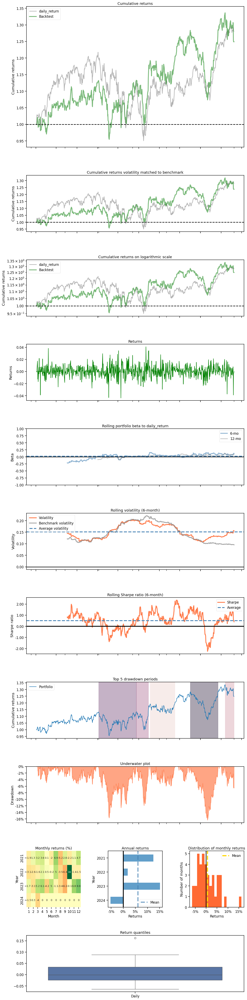

In [90]:
print("==============Compare to DJIA===========")
%matplotlib inline
# S&P 500: ^GSPC
# Dow Jones Index: ^DJI
# NASDAQ 100: ^NDX

backtest_plot(daily_account_value, 
            baseline_ticker = '^DJI', 
            baseline_start = TEST_START_DATE,
            baseline_end = TEST_END_DATE)

### Compare to Buy&Hold Strategy
pass in df_account_value, this information is stored in env class

<a id='6.2'></a>
## 7.2 BackTest with Buy&Hold Strategy

In [108]:
# print(DOW_30_TICKER)
# test_portfolio = DOW_30_TICKER
test_portfolio = ['AAPL']
modify_fields = ['open','high','low','close']
used_columns = ['date','close']

In [109]:
#baseline stats
print("==============Get Baseline Stats===========")
shape = daily_account_value.shape
df_hold_ = pd.DataFrame(0,index=range(shape[0]), columns=range(shape[1]))
df_hold_.columns = used_columns
df_hold_['date'] = daily_account_value.date

for stock in test_portfolio:
    df_stock_ = get_baseline(
        ticker=stock, 
        start = TEST_START_DATE,
        end = TEST_END_DATE)
    # for field in modify_fields:
    if len(df_stock_) < len(df_hold_):
        final_row = df_stock_.iloc[-1]
        new_rows = pd.DataFrame([final_row] * (len(df_hold_) - len(df_stock_)))
        df_stock_ = pd.concat([df_stock_, new_rows], ignore_index=True)
        
        for i in range(0,len(df_stock_) < len(df_hold_)):
            df_stock_.iloc[en(df_stock_)] = df_stock_.iloc[len(df_stock_-1)]
    df_stock_['close'] = df_stock_['close']/df_stock_.iloc[0]['close']/len(test_portfolio)
    df_hold_['close'] = df_hold_.close + df_stock_.close

stats = backtest_stats(df_hold_, value_col_name = 'close')

[*********************100%%**********************]  1 of 1 completed

==============Get Baseline Stats===========
Shape of DataFrame:  (805, 8)
Annual return          0.100704
Cumulative returns     0.359190
Annual volatility      0.273310
Sharpe ratio           0.487894
Calmar ratio           0.325769
Stability              0.574316
Max drawdown          -0.309128
Omega ratio            1.085810
Sortino ratio          0.708491
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.947442
Daily value at risk   -0.033905
dtype: float64


The model' calculation encompass the entire timeframe, including non-working days. To address this, we need to determine the most appropriate method to fill up the weekend plots, for example backfilling.

In [110]:
df_hold = pd.DataFrame()
df_hold['date'] = daily_account_value['date']
df_hold['hold'] = df_hold_['close'] / df_hold_['close'][0] * env_kwargs["initial_amount"]
# print("df_hold: ", df_hold)
# df_dji.to_csv("df_dji.csv")
df_hold = df_hold.set_index(df_hold.columns[0])
print("df_hold: ", df_hold)
# df_hold.to_csv("df_dji+.csv")

# df_account_value.to_csv('df_account_value.csv')

df_hold:                      hold
date                    
2021-01-04  1.000000e+06
2021-01-05  1.012364e+06
2021-01-06  9.782860e+05
2021-01-07  1.011668e+06
2021-01-08  1.020400e+06
...                  ...
2024-03-12  1.363993e+06
2024-03-13  1.347458e+06
2024-03-14  1.362182e+06
2024-03-15  1.359190e+06
2024-03-18  1.359190e+06

[806 rows x 1 columns]


==============Compare to Buy&Hold===========
result:                     stock          hold
date                                  
2021-01-04  1.000000e+06  1.000000e+06
2021-01-05  9.990010e+05  1.012364e+06
2021-01-06  1.011352e+06  9.782860e+05
2021-01-07  9.773085e+05  1.011668e+06
2021-01-08  1.010658e+06  1.020400e+06
...                  ...           ...
2024-03-11  1.440444e+06  1.360214e+06
2024-03-12  1.457485e+06  1.363993e+06
2024-03-13  1.461534e+06  1.347458e+06
2024-03-14  1.443819e+06  1.362182e+06
2024-03-15  1.459594e+06  1.359190e+06

[805 rows x 2 columns]


<Figure size 1500x500 with 0 Axes>

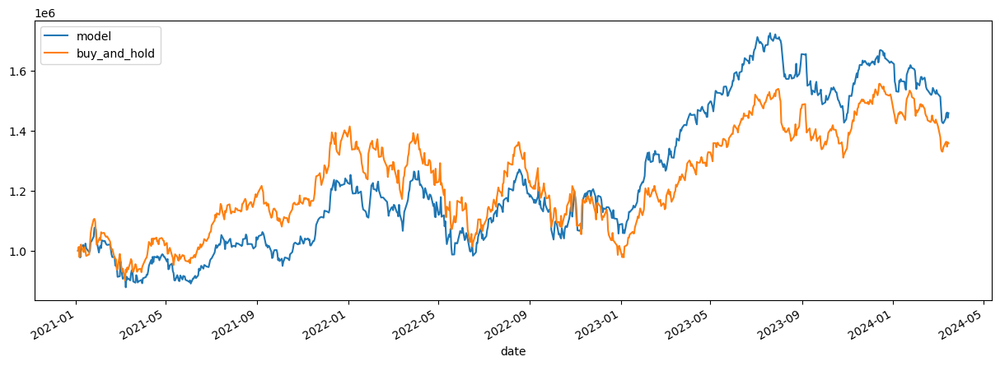

In [111]:
print("==============Compare to Buy&Hold===========")
df_result = pd.DataFrame({'date': df_account_value_ppo['date'], 'stock': df_account_value_ppo['account_value']})
df_result = df_result.set_index('date')

result = pd.DataFrame()
result = pd.merge(df_result, df_hold, left_index=True, right_index=True)
print("result: ", result)
# result.to_csv("result.csv")
result.columns = ['model', 'buy_and_hold']

%matplotlib inline
plt.rcParams["figure.figsize"] = (15,5)
plt.figure();
result.plot();

<a id='7.1'></a>
## 8.1 Save model

### 8.1.1 Save trained model

In [73]:
import os
current_dir = os.getcwd()
print(current_dir)

/Users/admin/Desktop/GameProjects/DataScience/DeepReinforcementLearning/FinRL-Tutorials-master/6-Binhlai_Testing


In [74]:
model_name = "./"+TRAINED_MODEL_DIR+"/main_dow30_randomTic_filter_4hiden_ppo6_8m_steps"
model_name

'./trained_models/main_dow30_randomTic_filter_4hiden_ppo6_8m_steps'

In [75]:
trained_ppo.save(model_name)

### 8.1.2 Save model as ONNX file

In [74]:
import torch as th
import torch.onnx
from stable_baselines3 import PPO
from stable_baselines3 import SAC
from stable_baselines3 import DDPG
from stable_baselines3.common.policies import BasePolicy
from typing import Tuple

In [72]:
class OnnxableSB3Policy(th.nn.Module):
    def __init__(self, policy: BasePolicy):
        super().__init__()
        self.policy = policy

    def forward(self, observation: th.Tensor) -> Tuple[th.Tensor, th.Tensor, th.Tensor]:
        # NOTE: Preprocessing is included, but postprocessing
        # (clipping/inscaling actions) is not,
        # If needed, you also need to transpose the images so that they are channel first
        # use deterministic=False if you want to export the stochastic policy
        # policy() returns `actions, values, log_prob` for PPO
        return self.policy(observation, deterministic=True)

In [76]:
onnx_policy = OnnxableSB3Policy(trained_ppo.policy)
observation_size = trained_ppo.observation_space.shape
dummy_input = th.randn(1, *observation_size)

# th.onnx.export(
#     onnx_policy,
#     dummy_input,
#     "main_dow30_randomTic_discrete_shortSell_256neu_ppo_4m_steps.onnx",
#     opset_version=17,
#     input_names=["input"],
# )

In [77]:
onnx_policy

OnnxableSB3Policy(
  (policy): ActorCriticPolicy(
    (features_extractor): FlattenExtractor(
      (flatten): Flatten(start_dim=1, end_dim=-1)
    )
    (pi_features_extractor): FlattenExtractor(
      (flatten): Flatten(start_dim=1, end_dim=-1)
    )
    (vf_features_extractor): FlattenExtractor(
      (flatten): Flatten(start_dim=1, end_dim=-1)
    )
    (mlp_extractor): MlpExtractor(
      (policy_net): Sequential(
        (0): Linear(in_features=19, out_features=256, bias=True)
        (1): Tanh()
        (2): Linear(in_features=256, out_features=256, bias=True)
        (3): Tanh()
      )
      (value_net): Sequential(
        (0): Linear(in_features=19, out_features=256, bias=True)
        (1): Tanh()
        (2): Linear(in_features=256, out_features=256, bias=True)
        (3): Tanh()
      )
    )
    (action_net): Linear(in_features=256, out_features=3, bias=True)
    (value_net): Linear(in_features=256, out_features=1, bias=True)
  )
)

<a id='7.2'></a>
## 8.2 Load model

<a id='7.2.1'></a>
### 8.2.1 Load trained model

In [66]:
from stable_baselines3 import PPO
import os
current_dir = os.getcwd()
print(current_dir)

/Users/admin/Desktop/GameProjects/DataScience/DeepReinforcementLearning/FinRL-Tutorials-master/6-Binhlai_Testing


In [67]:
model_name = "./"+TRAINED_MODEL_DIR+"/main_dow30_randomTic_filter_4hiden_ppo6_6m_steps"
model_name

'./trained_models/main_dow30_randomTic_filter_4hiden_ppo6_6m_steps'

In [68]:
trained_model = PPO.load(model_name)

Continous training based on the previous model at [**Part5. Train DRL Agents**](#5)

In [59]:
# #Establish the training environment using StockTradingEnv() class
# agent = DRLAgent(env = env_train)
# trained_model.env = env_train

In [64]:
# trained_ppo = agent.train_model(model=trained_model, 
#                              tb_log_name='ppo',
#                              total_timesteps=total_training_step)

#### Test loaded model

In [ ]:
test_env = StockTradingEnv(df = trade_data, **env_kwargs)

In [ ]:
test_step = 1000
test_result = []
test_env.reset()
for i in range(0,test_step):
    observation = [test_env.state]
    observation = np.array(observation).astype(np.float32)
    actions, values, log_prob = ort_sess.run(None, {"input": observation})
    result = test_env.step(actions)
    test_result.append(result[1])
    if result[2] == True:
        break

### 8.2.2 Load ONNX model

In [ ]:
import onnx
import onnxruntime as ort
import numpy as np

In [ ]:
onnx_path = "all_in_one_ppo.onnx"
onnx_model = onnx.load(onnx_path)
onnx.checker.check_model(onnx_model)

# # Check that the predictions are the same
# with th.no_grad():
#     print(model.policy(th.as_tensor(observation), deterministic=True))

In [ ]:
observation = np.zeros((1, state_space)).astype(np.float32)
ort_sess = ort.InferenceSession(onnx_path)
actions, values, log_prob = ort_sess.run(None, {"input": observation})
print(actions, values, log_prob)